In [1]:
!pip -q install wfdb==3.4.0
!wget -q https://www.physionet.org/static/published-projects/mitdb/mit-bih-arrhythmia-database-1.0.0.zip
!unzip -qo /content/mit-bih-arrhythmia-database-1.0.0.zip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.5/137.5 kB 1.3 MB/s eta 0:00:00


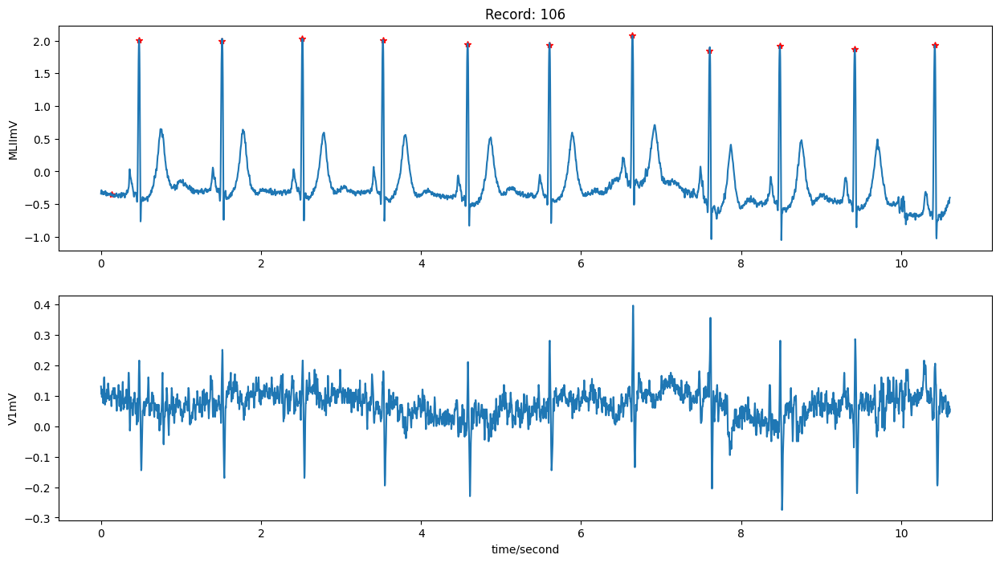

In [44]:
import os
import zipfile
import wfdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy import genfromtxt

# Path to the zip file and the directory to extract to
zip_path = "mit-bih-arrhythmia-database-1.0.0.zip"
extract_dir = "mit-bih-arrhythmia-database-1.0.0"

# Extract the zip file if it hasn't been extracted yet
if not os.path.exists(extract_dir):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

# Define the signal number
signal_number = 6

# Define the filename based on the extracted files
filename = f'{extract_dir}/{str(100 + signal_number)}'

# Read the record and annotation
record = wfdb.rdrecord(filename, sampfrom=180, sampto=4000)
annotation = wfdb.rdann(filename, 'atr', sampfrom=180, sampto=4000, shift_samps=True)

# Plot the record with the annotation
wfdb.plot_wfdb(record=record, annotation=annotation, time_units='seconds', figsize=(15, 8))


In [45]:
ecg = pd.DataFrame(np.array([list(range(len(record.adc()))),record.adc()[:,0]]).T,columns=['TimeStamp','ecg'])

print(ecg)

      TimeStamp  ecg
0             0  956
1             1  965
2             2  967
3             3  965
4             4  958
...         ...  ...
3815       3815  926
3816       3816  929
3817       3817  938
3818       3818  943
3819       3819  944

[3820 rows x 2 columns]


In [46]:
import pandas as pd

# Assume df is already defined

# Convert the 'SCG' column to a NumPy array
signal_values = ecg['ecg'].to_numpy()

# Now, scg_array contains the 'SCG' column as a NumPy array
print(signal_values)

[956 965 967 ... 938 943 944]


In [47]:
import numpy as np

# Function to save the array to a .dat file
def save_array_to_dat(array, file_path, max_entries=10000):
    '''
    Save a NumPy array to a .dat file with a maximum number of entries
    Args:
        array: NumPy array to be saved
        file_path: Path to the .dat file
        max_entries: Maximum number of entries to save (default is 10000)
    '''
    np.savetxt(file_path, array[:max_entries])

# Save the first 10000 entries of the array to a .dat file
save_array_to_dat(signal_values, "signal_values_arrythmia_ex1.dat", max_entries=10000)

In [48]:
def read_ecg(file_name):
	return genfromtxt(file_name, delimiter=',')


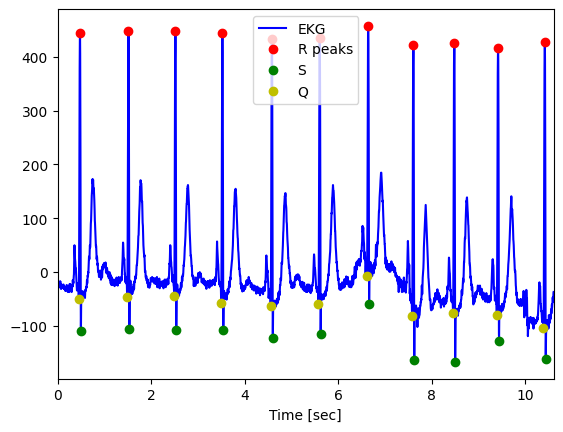

ECG


In [49]:
def QRS_test(file_name):
    '''
    QRS detection on file_name
    assuming 360 Hz sampling rate, may not work with very low sampling rate signal
    args:
        file_name: file containing ecg data in one column
    '''
    fs = 360
    # Constructing the file path using the correct directory structure
    file_path = os.path.join('/content/sample_data/data', file_name)
    if not os.path.isfile(file_path):
        raise AssertionError(f"{file_path} does not exist")
    ecg = read_ecg(file_path)
    R_peaks, S_point, Q_point = EKG_QRS_detect(ecg, fs, True, True)



    # Plotting the ECG signal and detected points

    if len(R_peaks) > 0:
        print("ECG")
    else:
        print("Not an ECG")

# Provide the file name directly
QRS_test("/content/signal_values_arrythmia_ex1.dat")


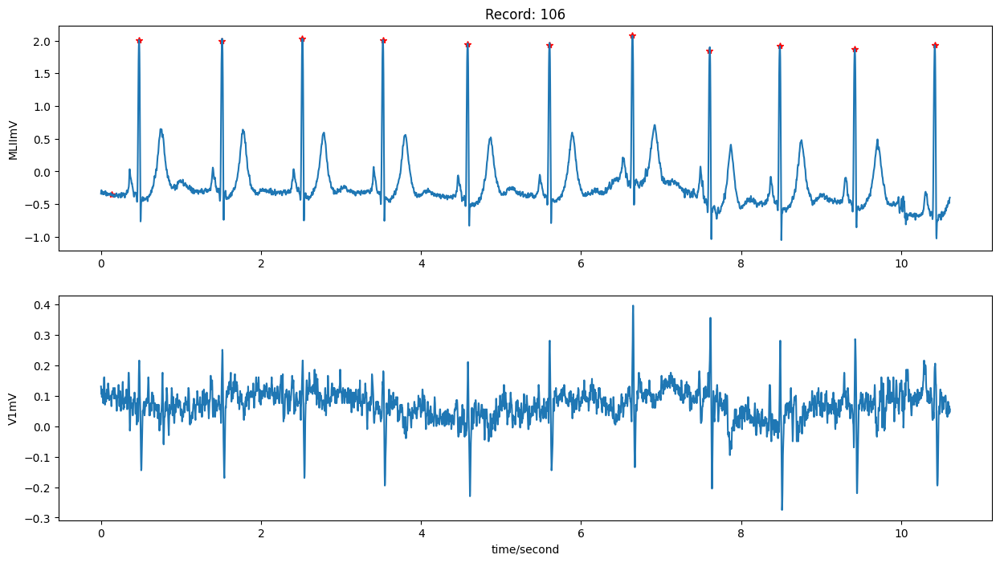

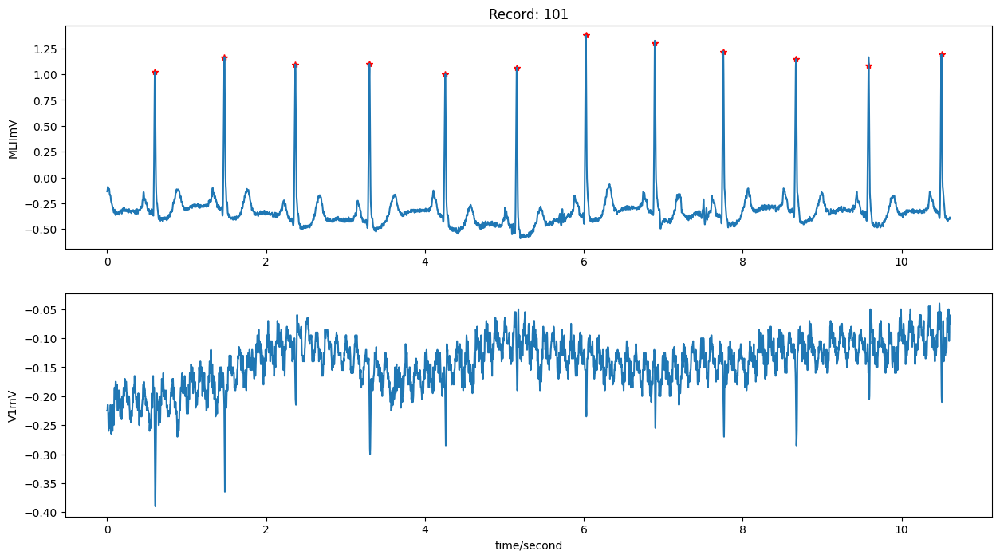

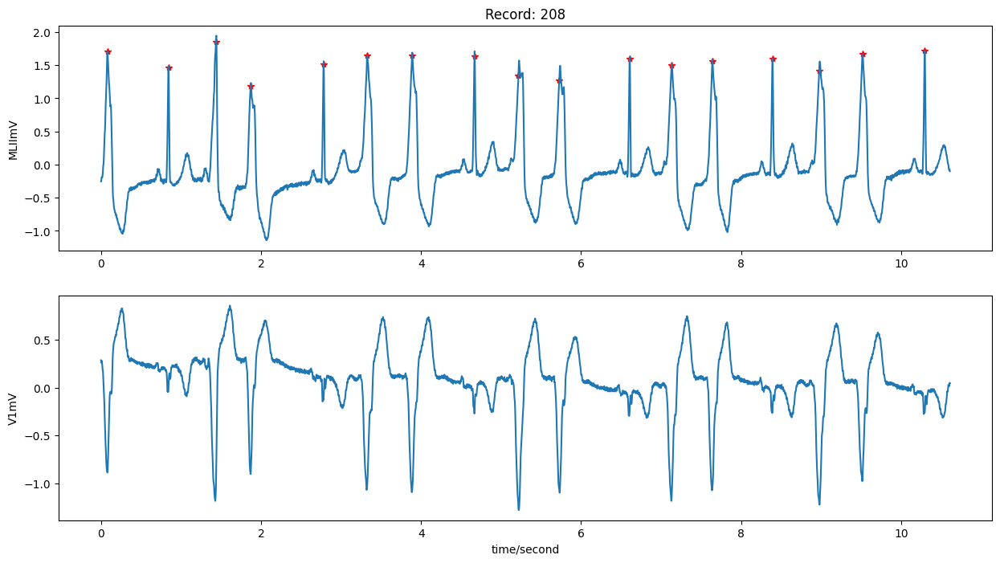

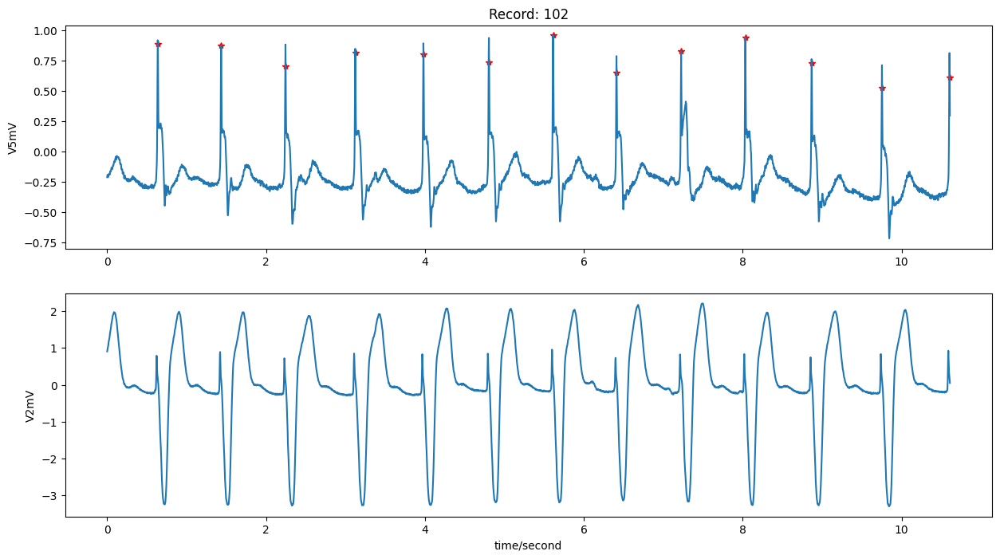

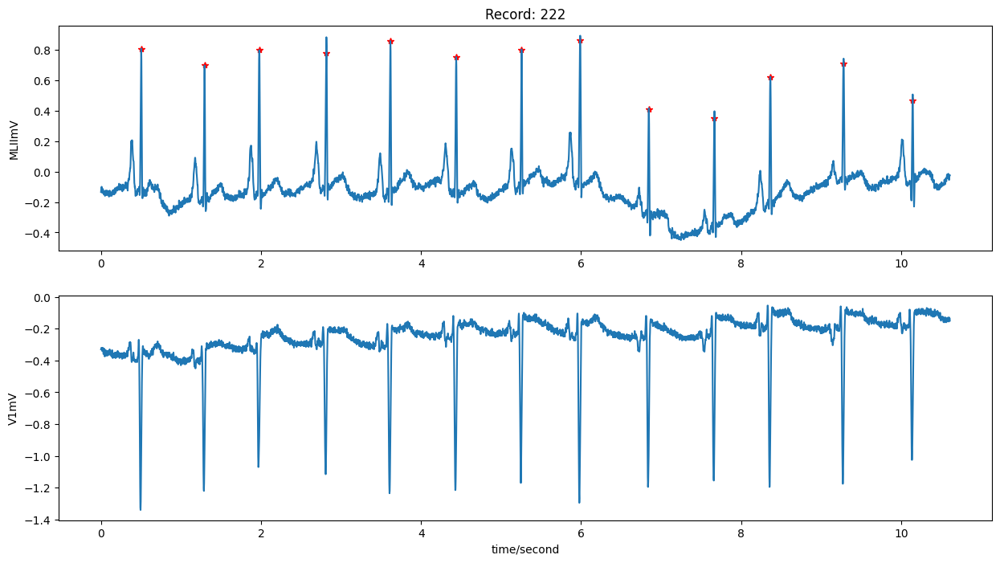

...

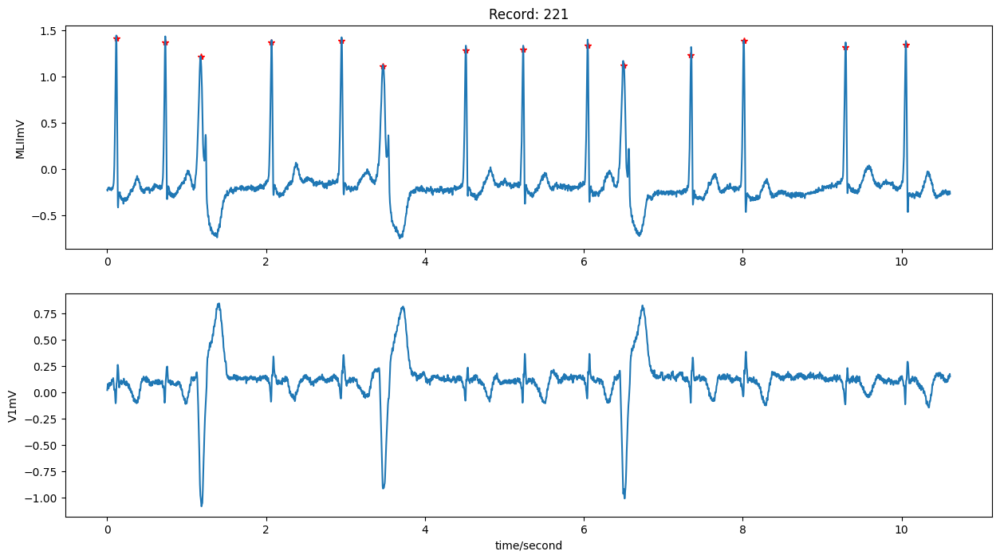

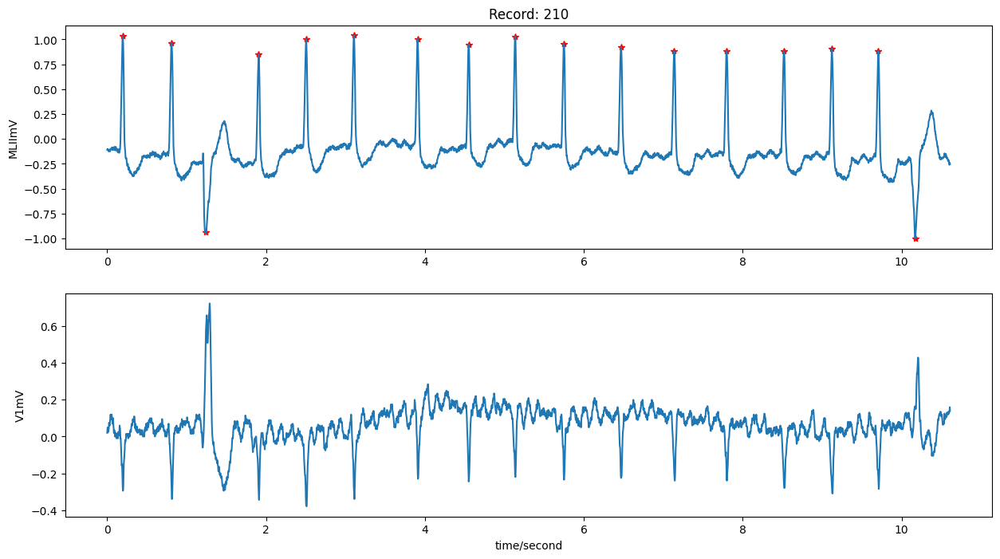

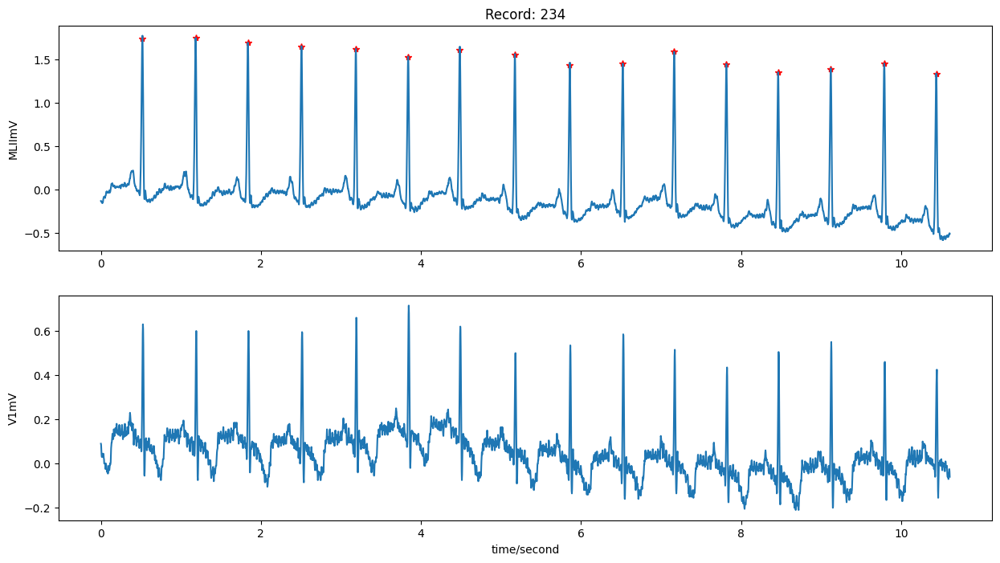

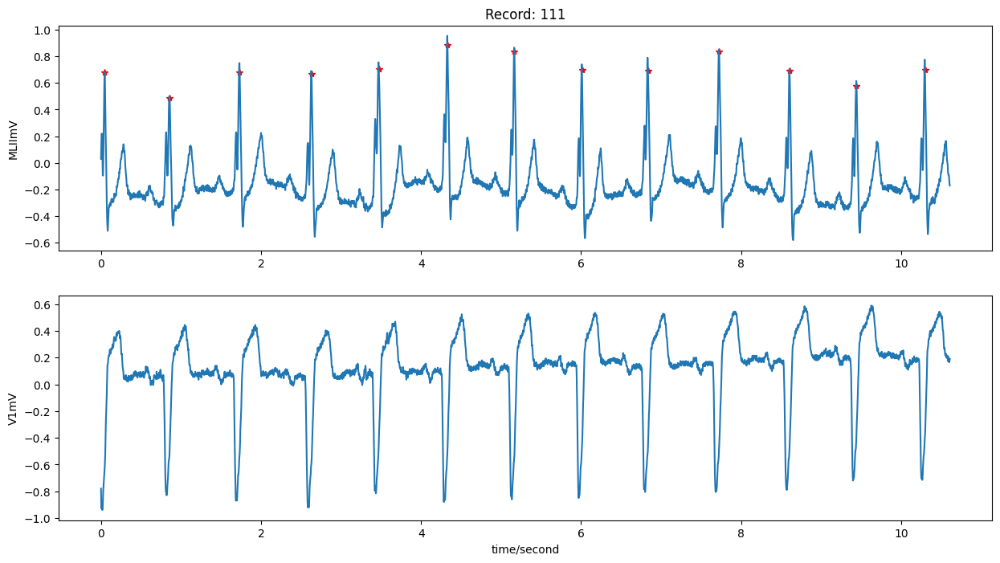

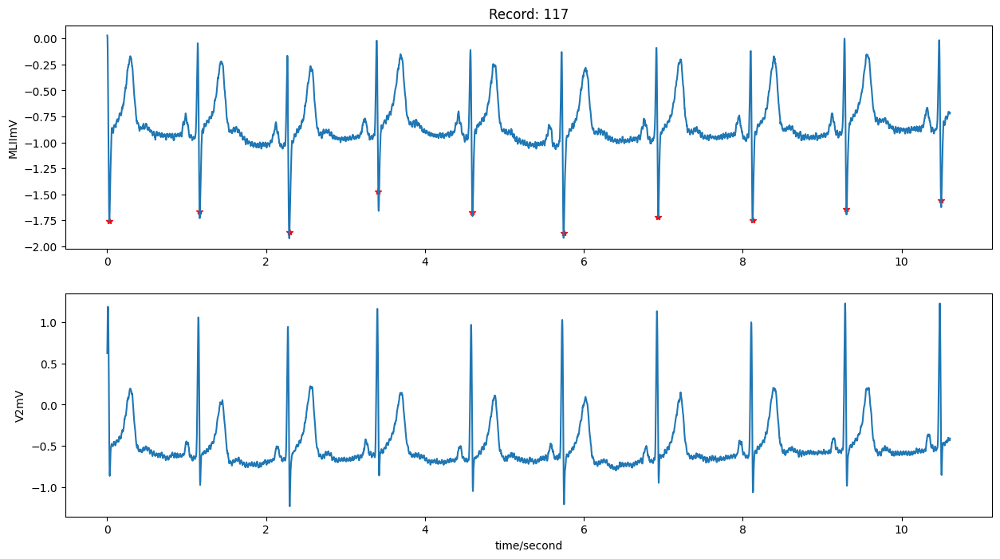

In [50]:
import os
import zipfile
import wfdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Path to the zip file and the directory to extract to
zip_path = "mit-bih-arrhythmia-database-1.0.0.zip"
extract_dir = "mit-bih-arrhythmia-database-1.0.0"

# Extract the zip file if it hasn't been extracted yet
if not os.path.exists(extract_dir):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

# Get a list of all .hea files in the directory
hea_files = [f for f in os.listdir(extract_dir) if f.endswith('.hea')]

# Iterate over each .hea file to process the corresponding record and annotation
for hea_file in hea_files:
    # Define the base filename without the extension
    base_filename = os.path.splitext(hea_file)[0]

    # Define the full path for the record and annotation files
    record_path = os.path.join(extract_dir, base_filename)

    # Read the record and annotation
    record = wfdb.rdrecord(record_path, sampfrom=180, sampto=4000)
    annotation = wfdb.rdann(record_path, 'atr', sampfrom=180, sampto=4000, shift_samps=True)

    # Plot the record with the annotation
    wfdb.plot_wfdb(record=record, annotation=annotation, time_units='seconds', figsize=(15, 8))


In [51]:
import os
import wfdb
import numpy as np
import pandas as pd

# Directory containing the extracted MIT-BIH Arrhythmia Database files
extract_dir = "mit-bih-arrhythmia-database-1.0.0"

# Get all record files in the directory
record_files = [f for f in os.listdir(extract_dir) if f.endswith('.hea')]

# Loop through each record file and process it
for record_file in record_files:
    # Construct the filename without the extension
    record_name = os.path.splitext(record_file)[0]
    filename = os.path.join(extract_dir, record_name)

    # Read the record and annotation
    try:
        record = wfdb.rdrecord(filename, sampfrom=180, sampto=4000)
        annotation = wfdb.rdann(filename, 'atr', sampfrom=180, sampto=4000, shift_samps=True)

        # Create a DataFrame for the ECG data
        ecg = pd.DataFrame(np.array([list(range(len(record.p_signal))), record.p_signal[:, 0]]).T, columns=['TimeStamp', 'ECG'])

        # Convert the 'ECG' column to a NumPy array
        signal_values = ecg['ECG'].to_numpy()

        # Print the DataFrame for verification
        print(f"ECG Data for record {record_name}:\n", ecg.head())

        # Print the NumPy array of signal values
        print(f"NumPy array of signal values for record {record_name}:\n", signal_values[:10])  # Print first 10 values for brevity

    except Exception as e:
        print(f"Error processing record {record_name}: {e}")


ECG Data for record 106:
    TimeStamp    ECG
0        0.0 -0.340
1        1.0 -0.295
2        2.0 -0.285
3        3.0 -0.295
4        4.0 -0.330
NumPy array of signal values for record 106:
 [-0.34  -0.295 -0.285 -0.295 -0.33  -0.345 -0.345 -0.32  -0.31  -0.335]
ECG Data for record 101:
    TimeStamp    ECG
0        0.0 -0.135
1        1.0 -0.125
2        2.0 -0.110
3        3.0 -0.090
4        4.0 -0.105
NumPy array of signal values for record 101:
 [-0.135 -0.125 -0.11  -0.09  -0.105 -0.12  -0.12  -0.12  -0.11  -0.11 ]
ECG Data for record 208:
    TimeStamp    ECG
0        0.0 -0.255
1        1.0 -0.250
2        2.0 -0.225
3        3.0 -0.190
4        4.0 -0.190
NumPy array of signal values for record 208:
 [-0.255 -0.25  -0.225 -0.19  -0.19  -0.195 -0.195 -0.165 -0.13  -0.065]
ECG Data for record 102:
    TimeStamp    ECG
0        0.0 -0.215
1        1.0 -0.200
2        2.0 -0.195
3        3.0 -0.205
4        4.0 -0.215
NumPy array of signal values for record 102:
 [-0.215 -0.2   -

Signal values for record 106:
 [-0.34  -0.295 -0.285 ... -0.43  -0.405 -0.4  ]


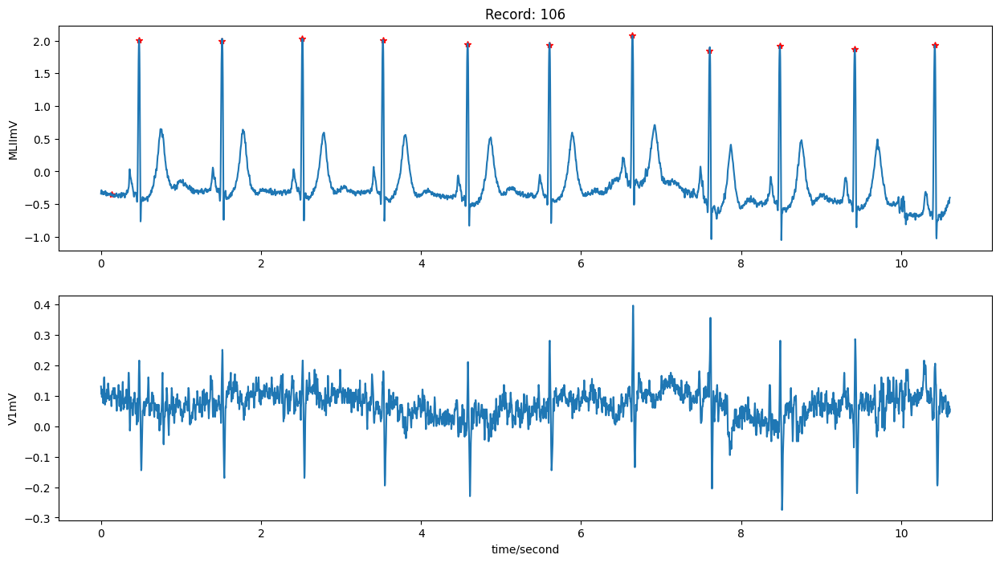

Signal values for record 101:
 [-0.135 -0.125 -0.11  ... -0.39  -0.385 -0.4  ]


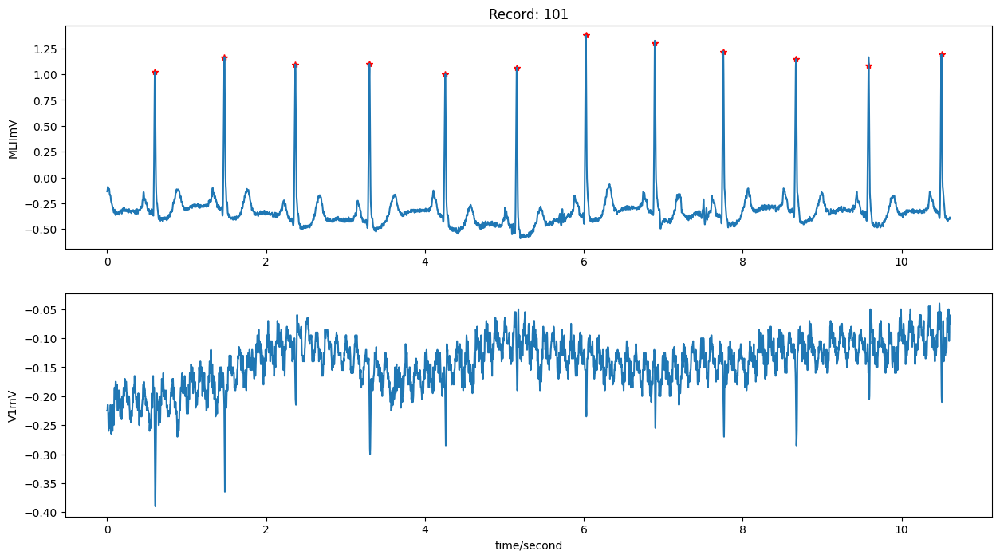

Signal values for record 208:
 [-0.255 -0.25  -0.225 ... -0.07  -0.075 -0.1  ]


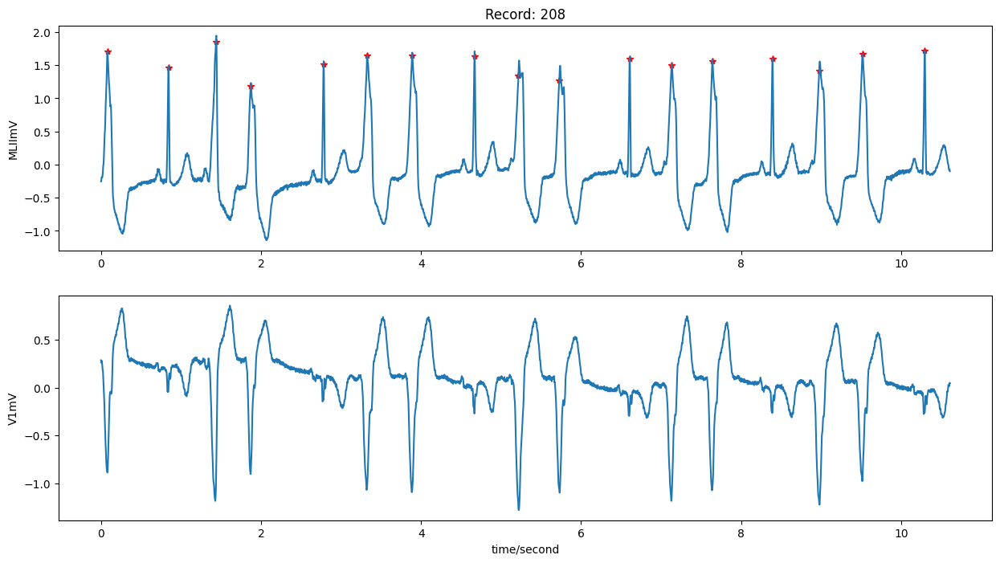

Signal values for record 102:
 [-0.215 -0.2   -0.195 ...  0.81   0.61   0.295]


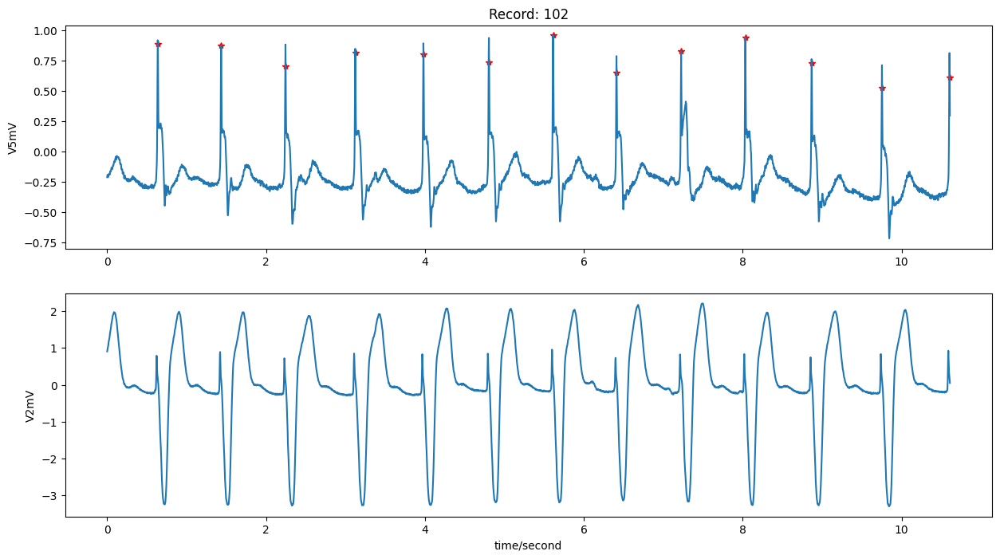

Signal values for record 222:
 [-0.135 -0.115 -0.105 ... -0.025 -0.03  -0.025]


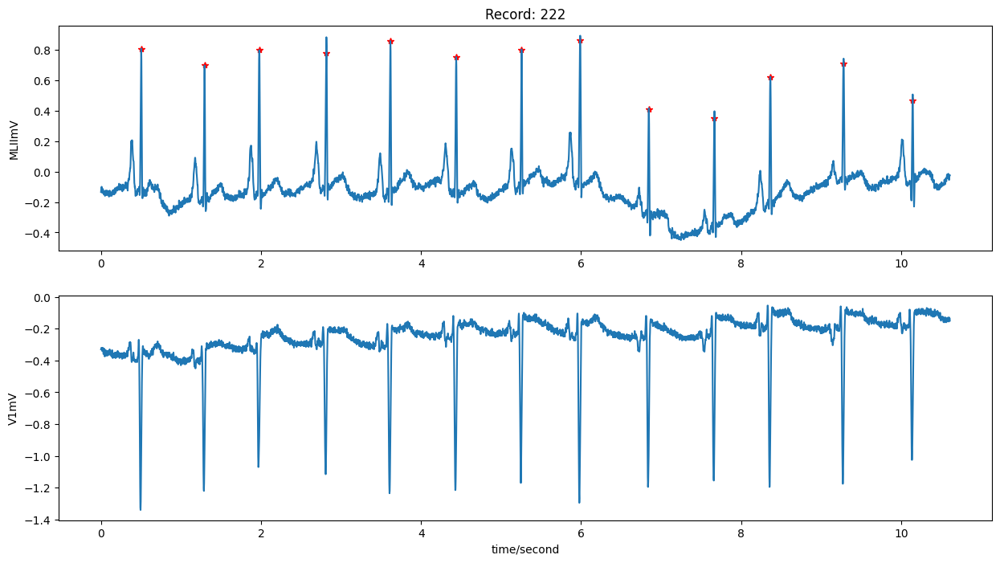

Signal values for record 124:
 [-0.85  -0.865 -0.865 ... -0.92  -0.93  -0.925]


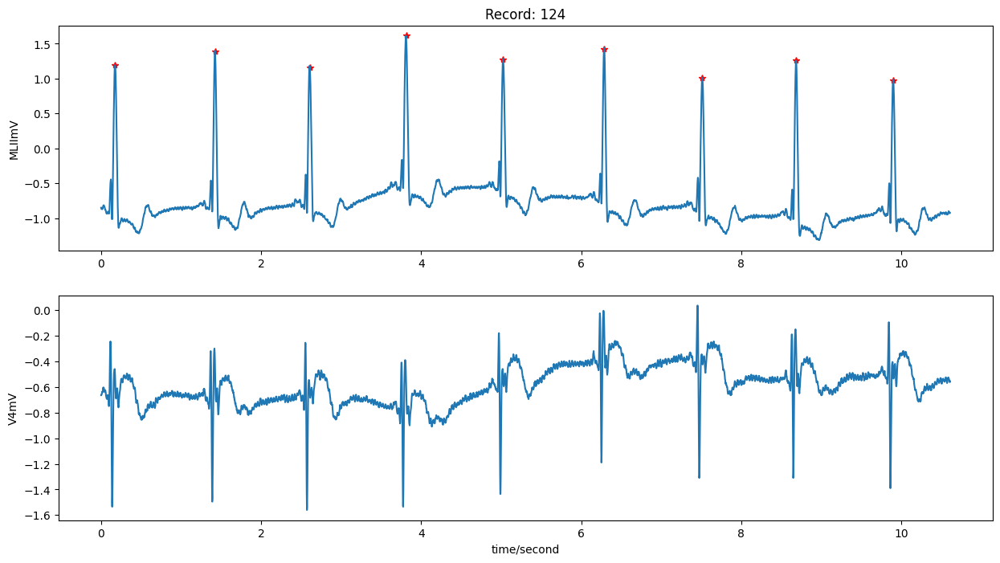

Signal values for record 114:
 [-0.285 -0.295 -0.285 ... -0.15  -0.145 -0.13 ]


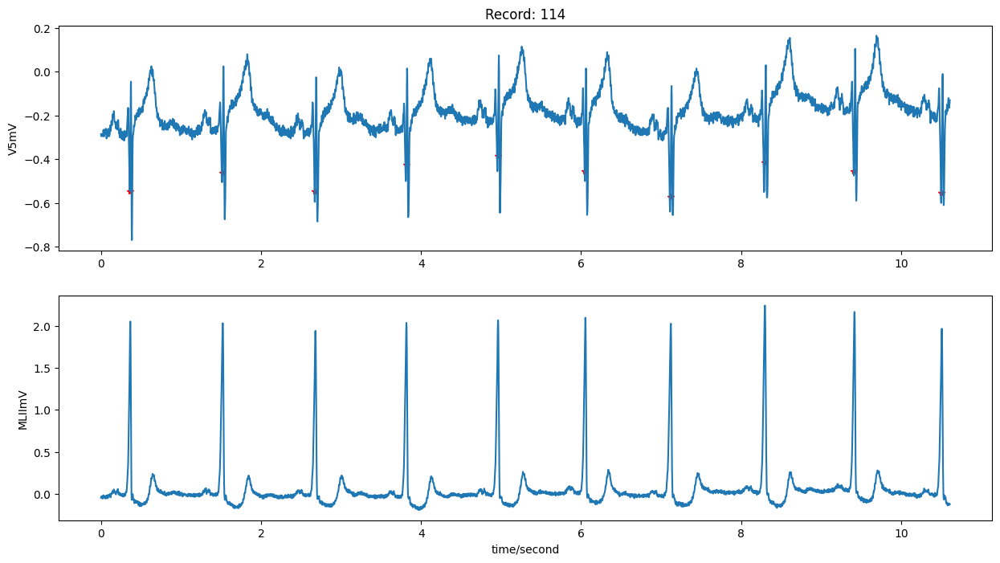

Signal values for record 223:
 [-0.62  -0.595 -0.585 ... -0.72  -0.715 -0.725]


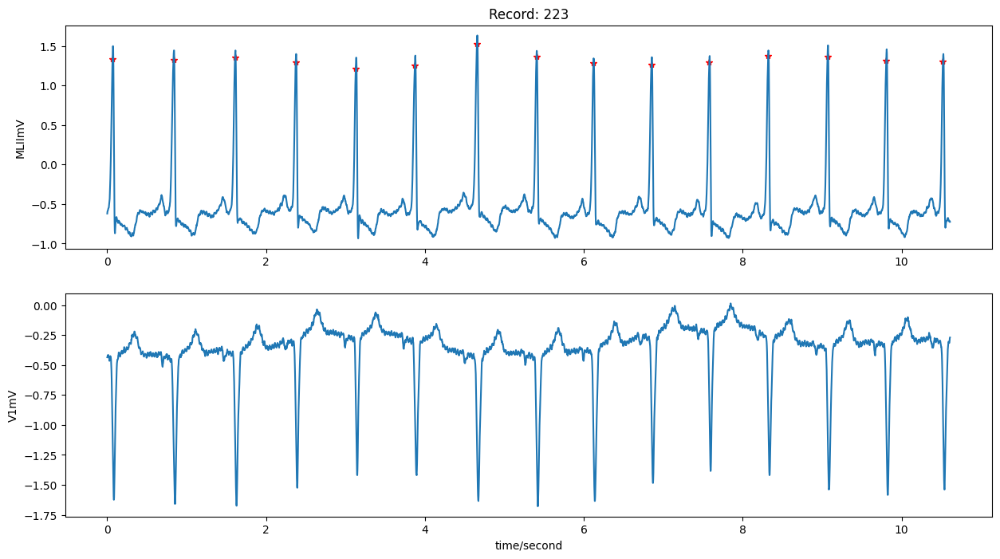

Signal values for record 213:
 [ 0.255  0.275  0.3   ... -0.81  -0.73  -0.57 ]


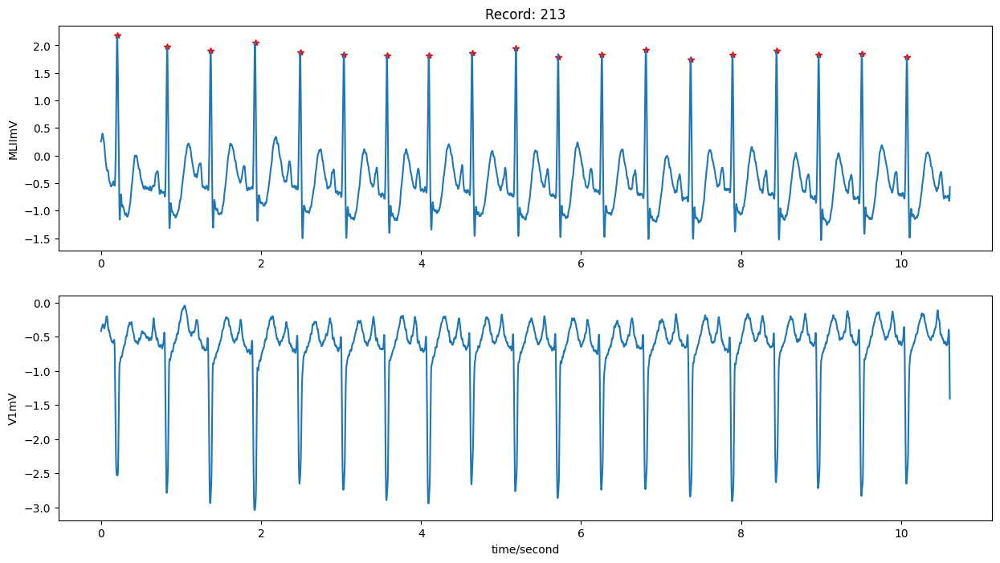

Signal values for record 119:
 [-0.86  -0.87  -0.88  ... -0.92  -0.915 -0.91 ]


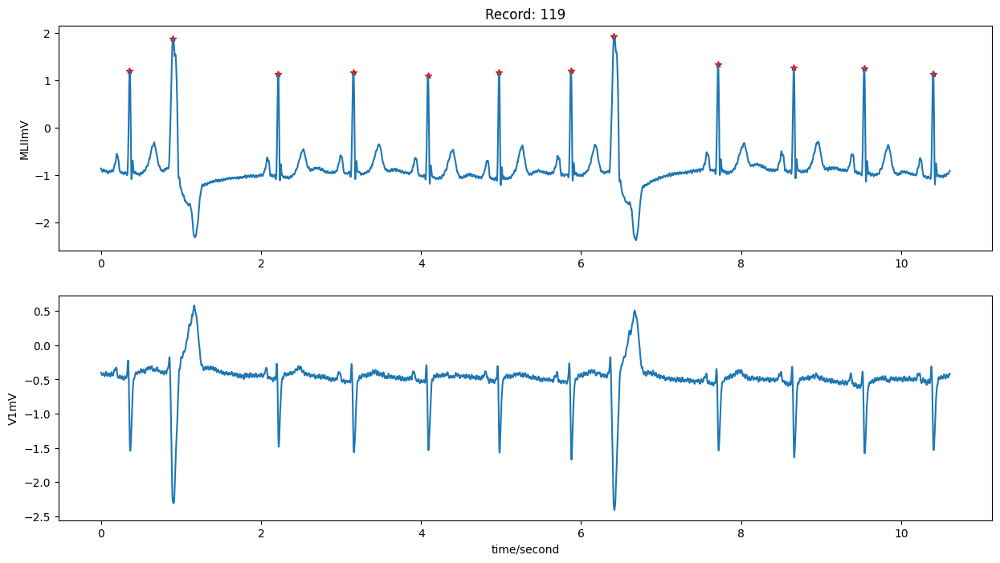

Signal values for record 228:
 [-0.255 -0.26  -0.245 ... -0.32  -0.31  -0.295]


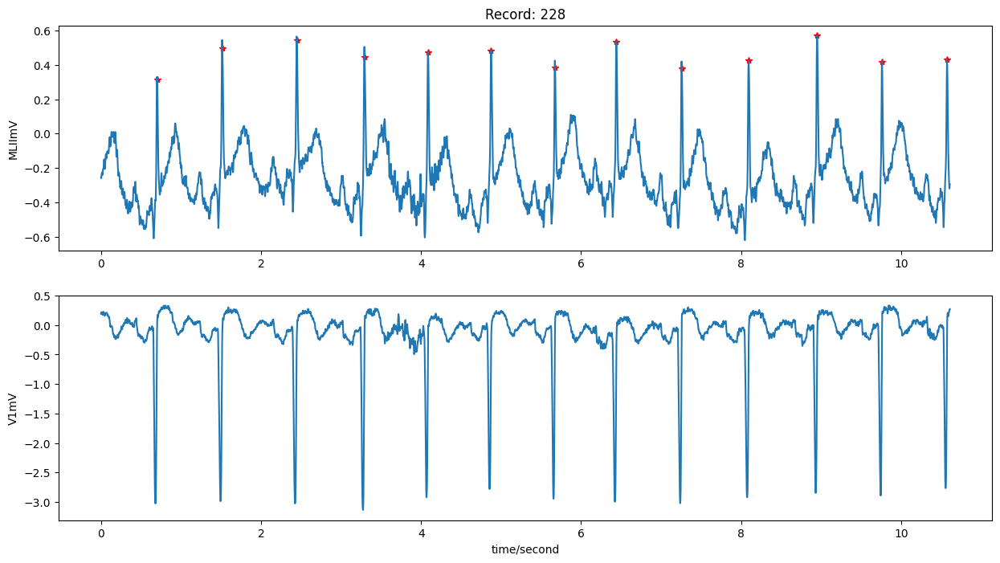

Signal values for record 112:
 [-1.01  -1.01  -0.99  ... -0.635 -0.625 -0.625]


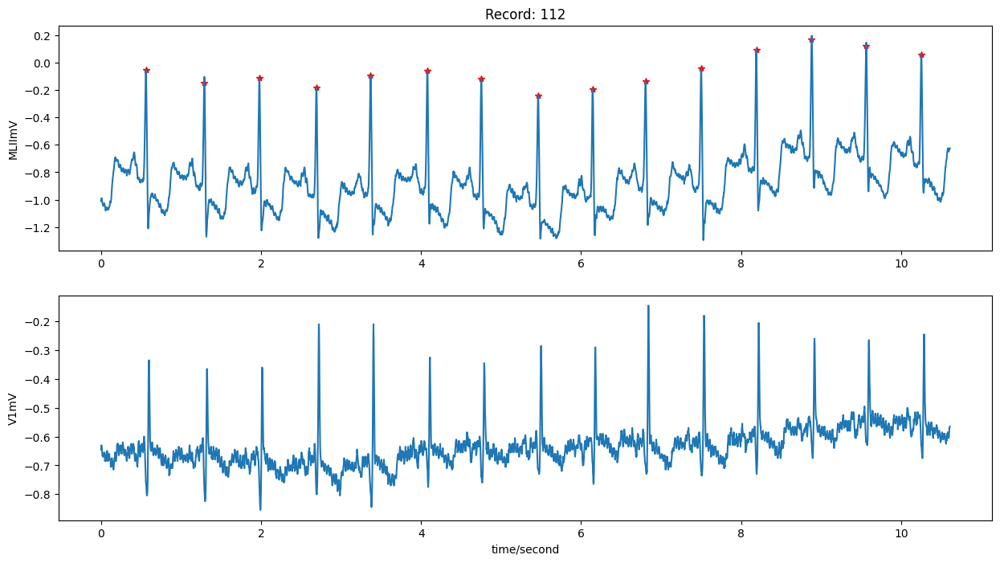

Signal values for record 123:
 [-0.54 -0.52 -0.5  ... -0.87 -0.85 -0.85]


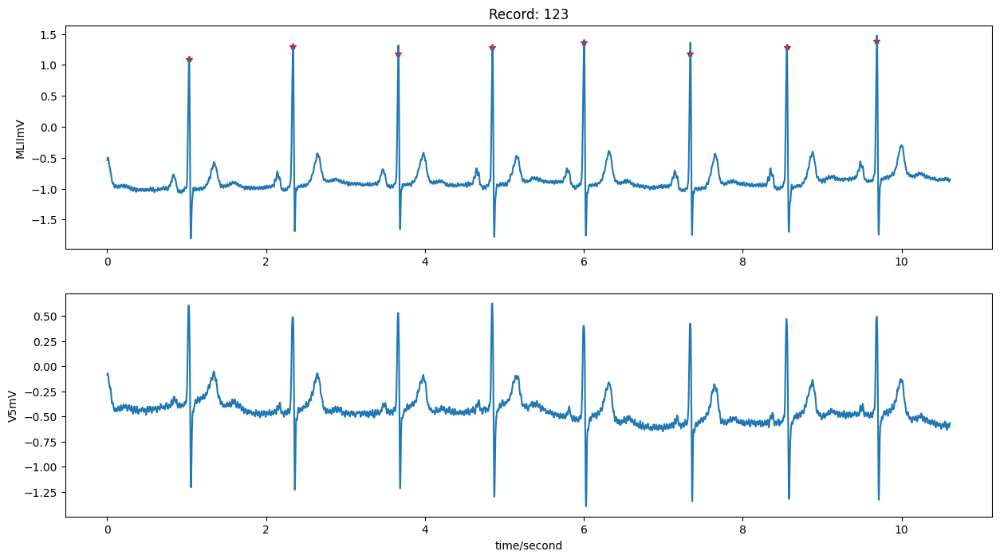

Signal values for record 107:
 [-0.325 -0.33  -0.335 ... -2.34  -2.38  -2.405]


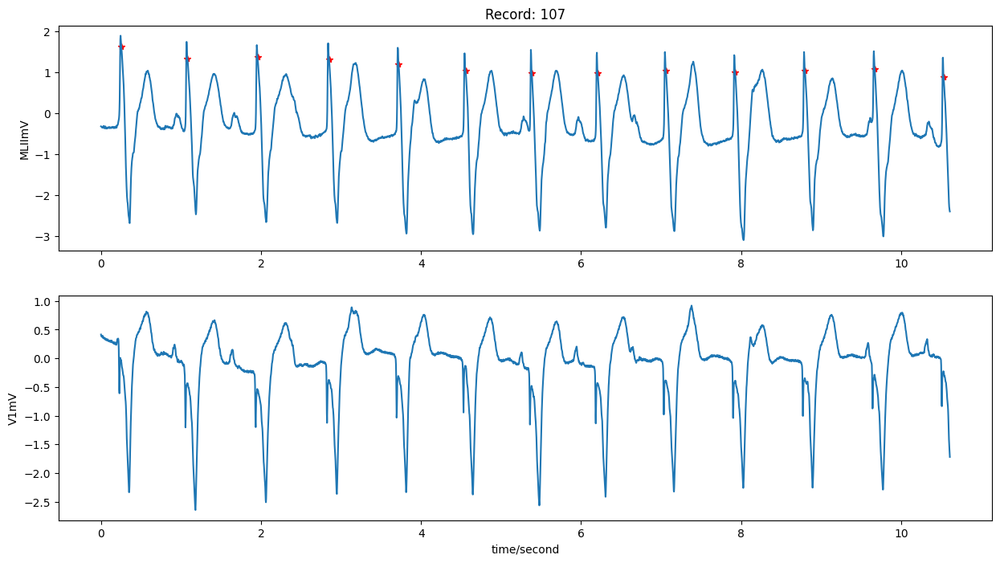

Signal values for record 108:
 [-0.16  -0.155 -0.165 ... -0.05  -0.045 -0.035]


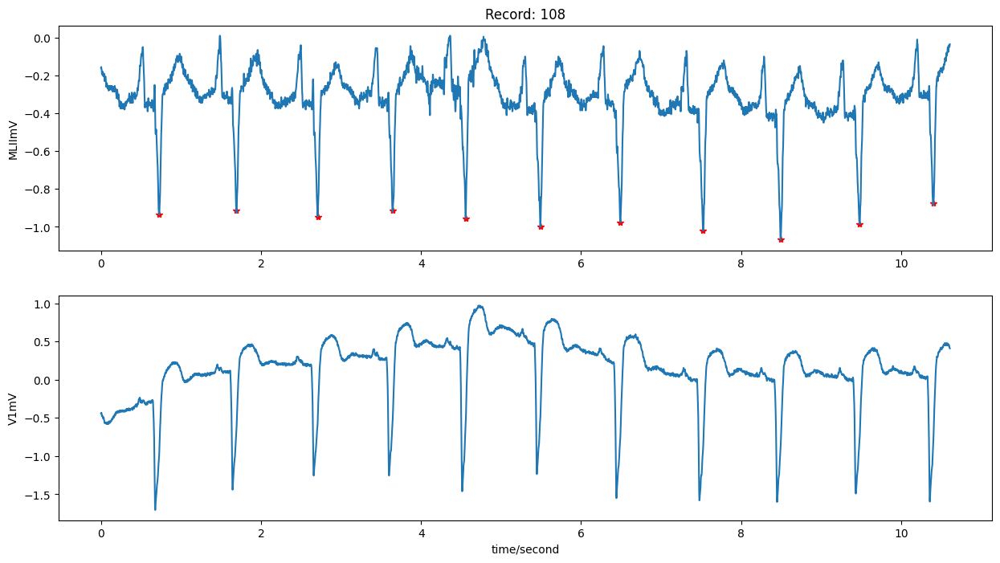

Signal values for record 201:
 [-0.295 -0.3   -0.305 ... -0.285 -0.28  -0.275]


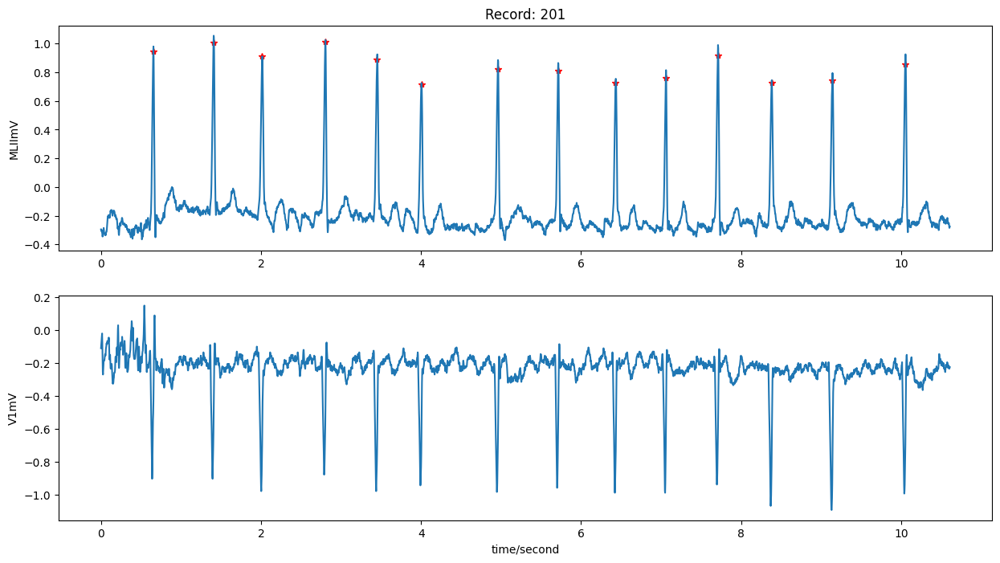

Signal values for record 220:
 [-0.64  -0.645 -0.635 ... -0.565 -0.565 -0.55 ]


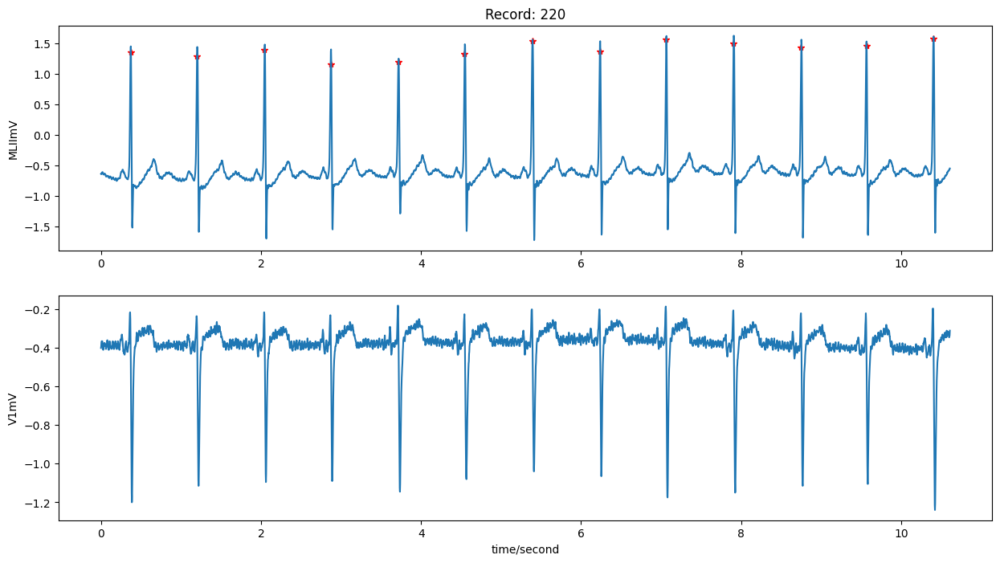

Signal values for record 209:
 [-0.26  -0.25  -0.215 ... -0.15  -0.135 -0.125]


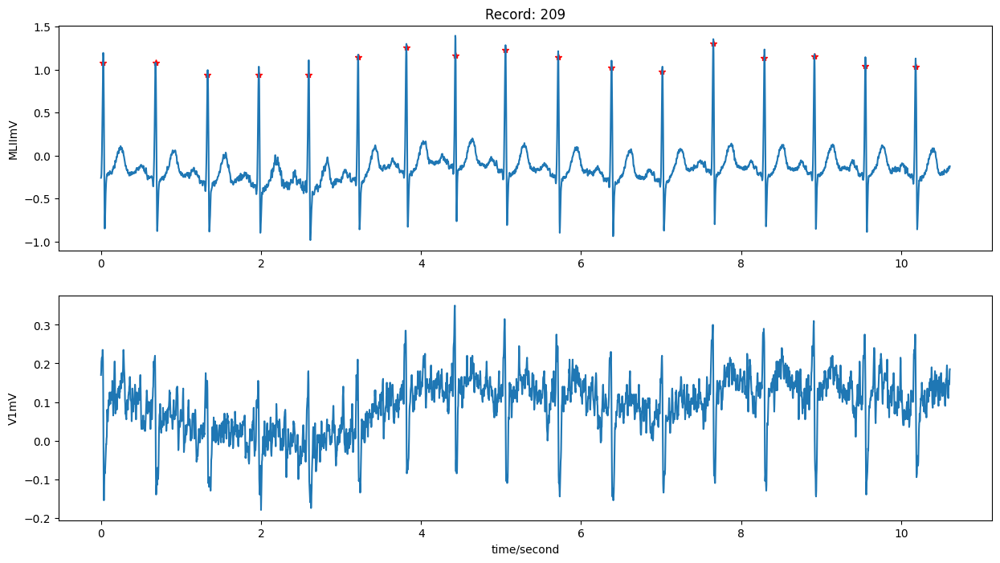

Signal values for record 212:
 [-0.19  -0.21  -0.225 ... -0.42  -0.44  -0.45 ]


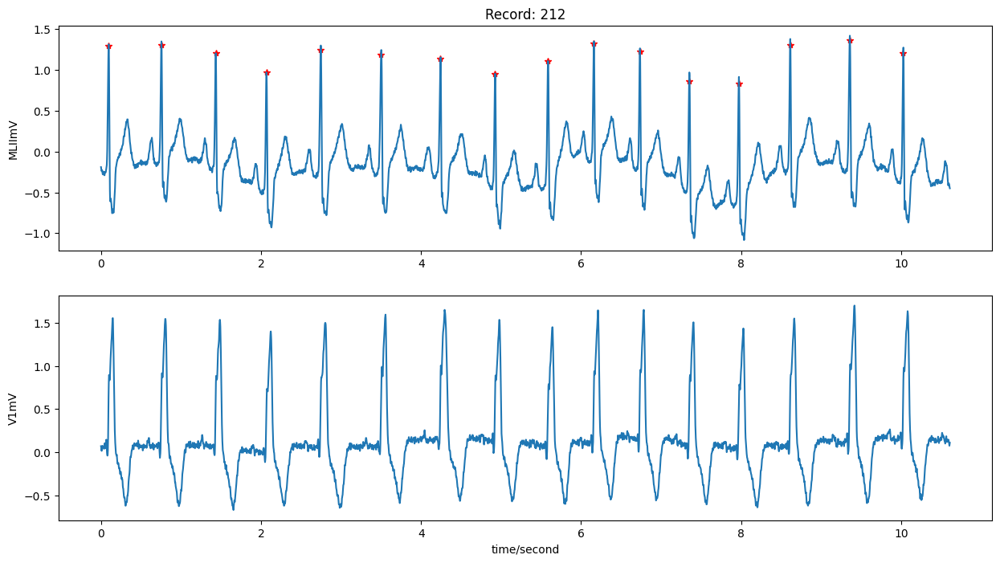

Signal values for record 233:
 [-0.005  0.005 -0.005 ...  0.1    0.085  0.08 ]


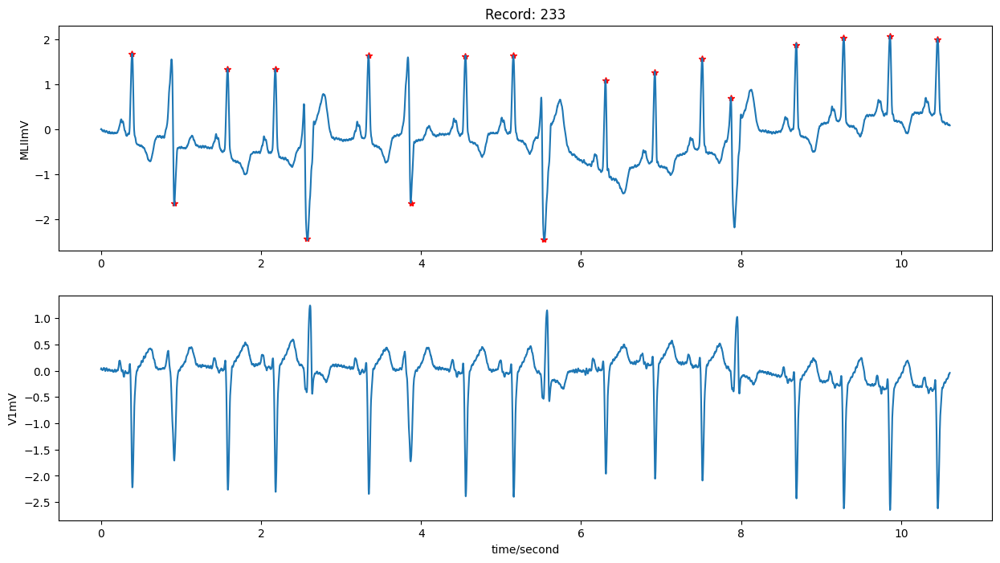

Signal values for record 205:
 [-0.365 -0.345 -0.355 ... -0.385 -0.39  -0.38 ]


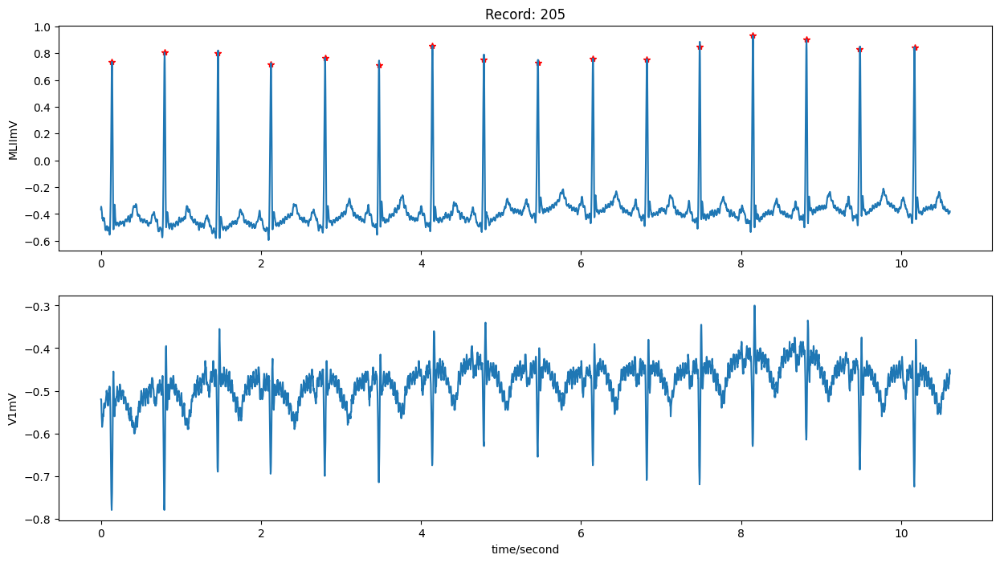

Signal values for record 203:
 [-0.08  -0.055 -0.03  ...  1.39   1.235  1.1  ]


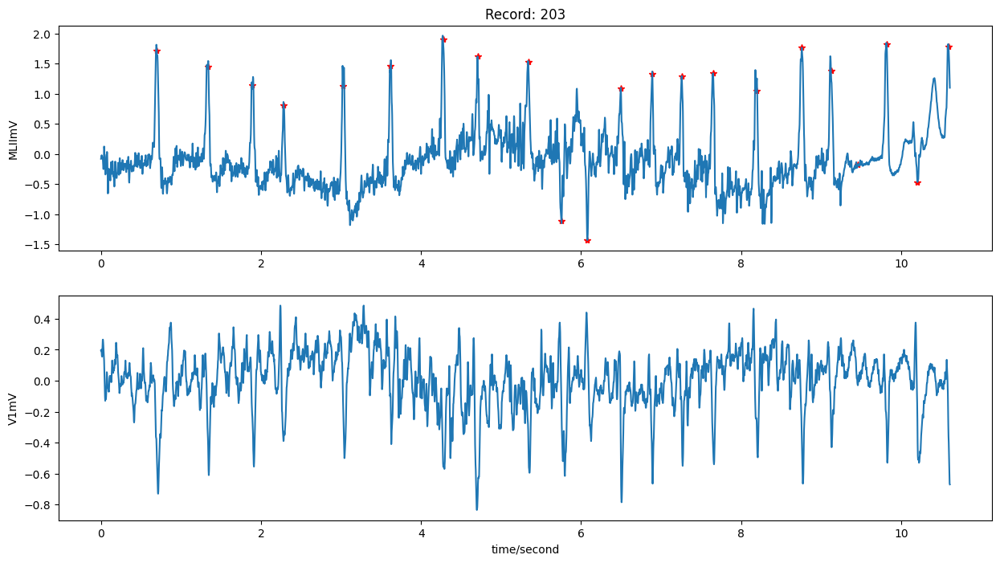

Signal values for record 121:
 [-0.685 -0.715 -0.725 ... -1.06  -1.065 -1.07 ]


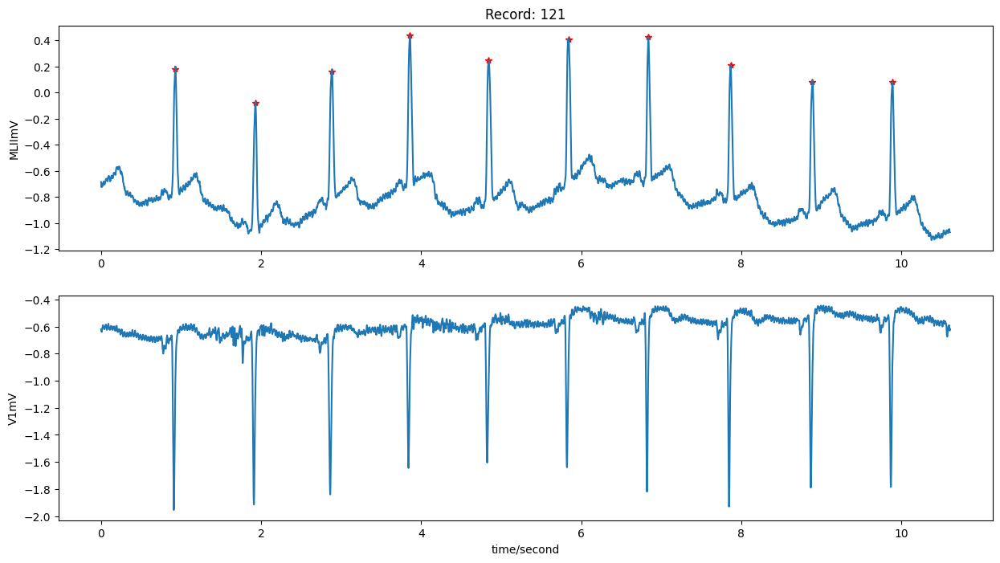

Signal values for record 109:
 [-0.485 -0.495 -0.49  ... -0.39  -0.385 -0.375]


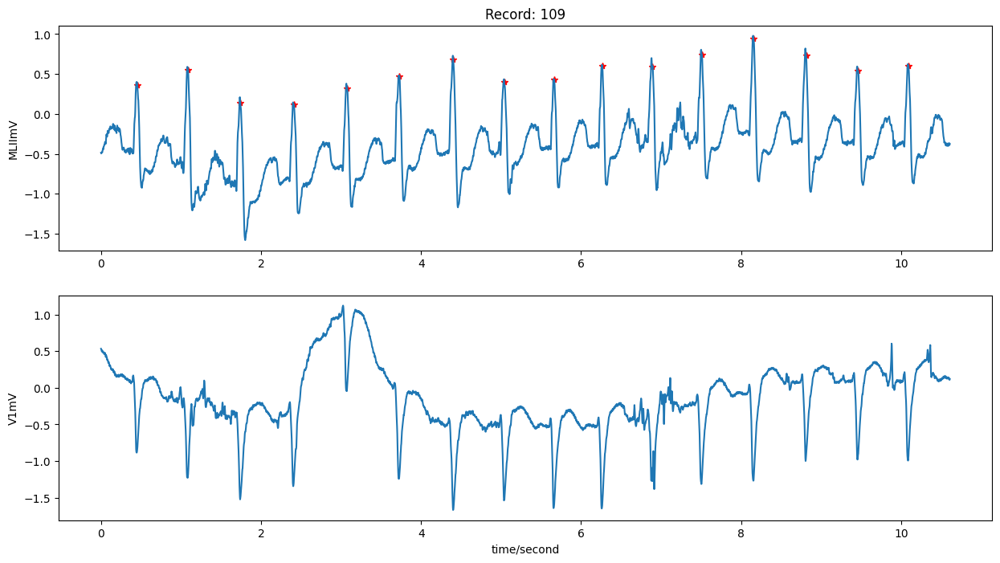

Signal values for record 200:
 [-0.205 -0.21  -0.195 ... -0.445 -0.44  -0.45 ]


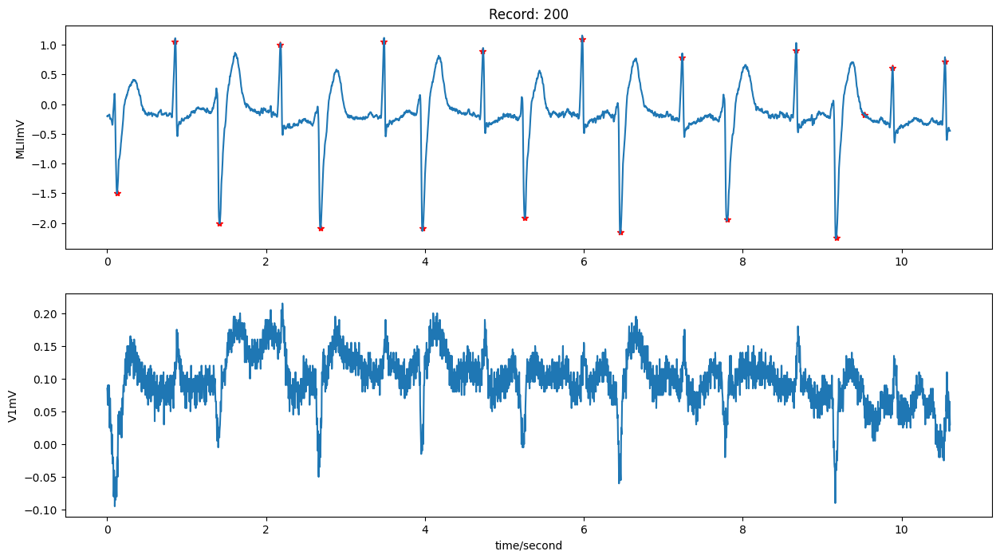

Signal values for record 113:
 [-0.46  -0.495 -0.515 ... -0.25  -0.235 -0.22 ]


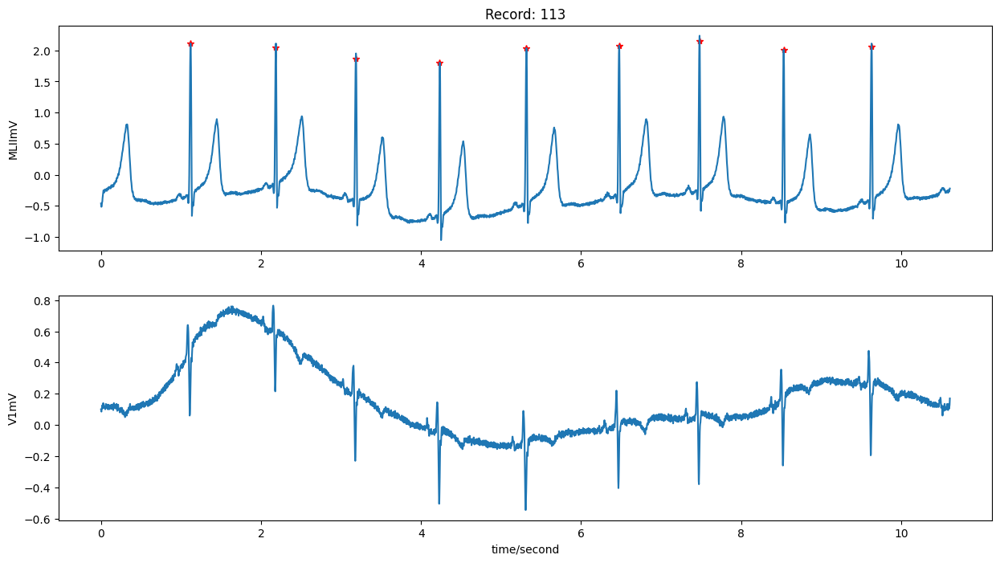

Signal values for record 231:
 [ 1.52   1.43   1.14  ... -0.01   0.01   0.025]


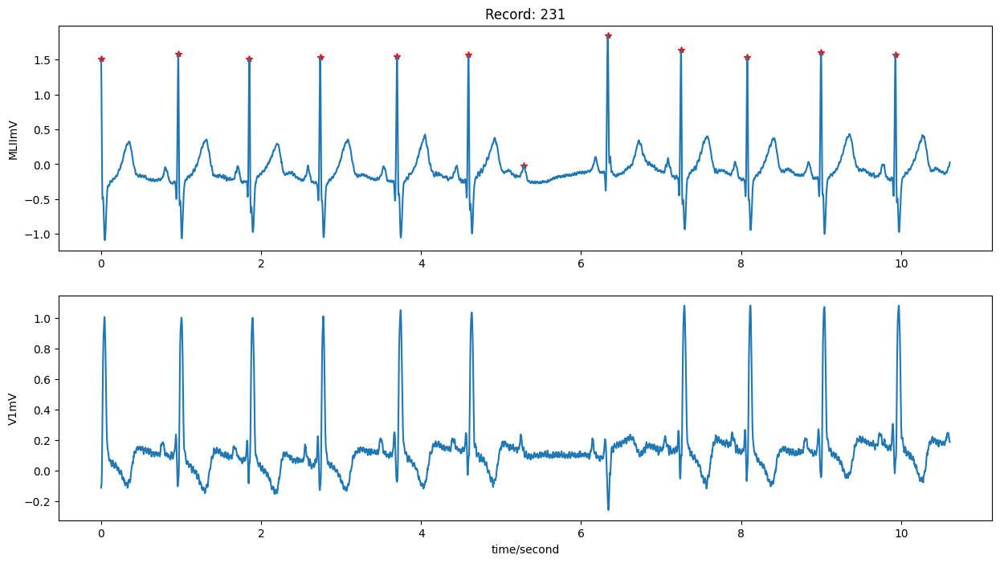

Signal values for record 215:
 [ 0.195  0.205  0.205 ... -0.185 -0.19  -0.175]


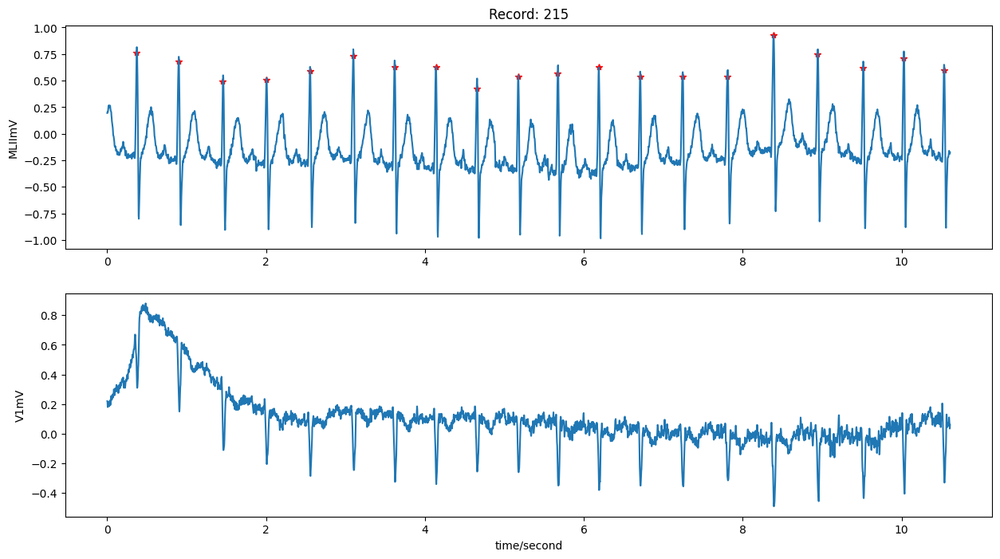

Signal values for record 219:
 [-0.57  -0.56  -0.565 ... -0.625 -0.615 -0.61 ]


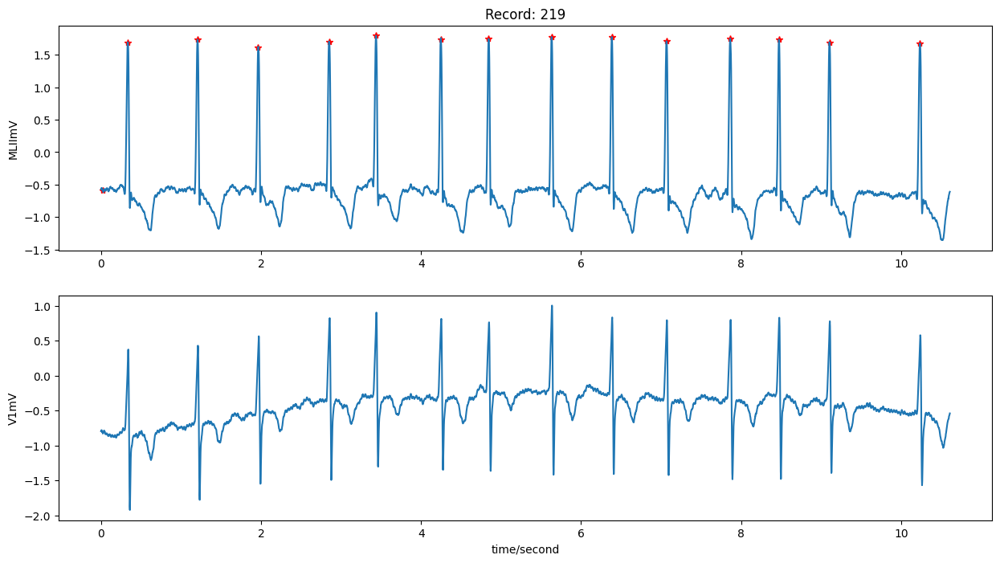

Signal values for record 115:
 [-0.49  -0.505 -0.52  ... -0.615 -0.615 -0.61 ]


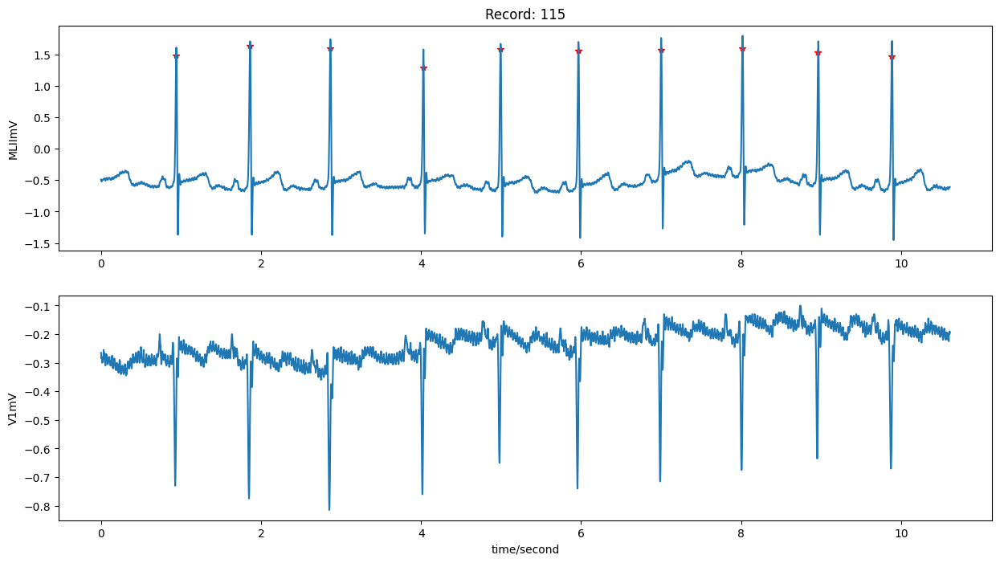

Signal values for record 105:
 [-0.355 -0.365 -0.37  ... -0.265 -0.275 -0.295]


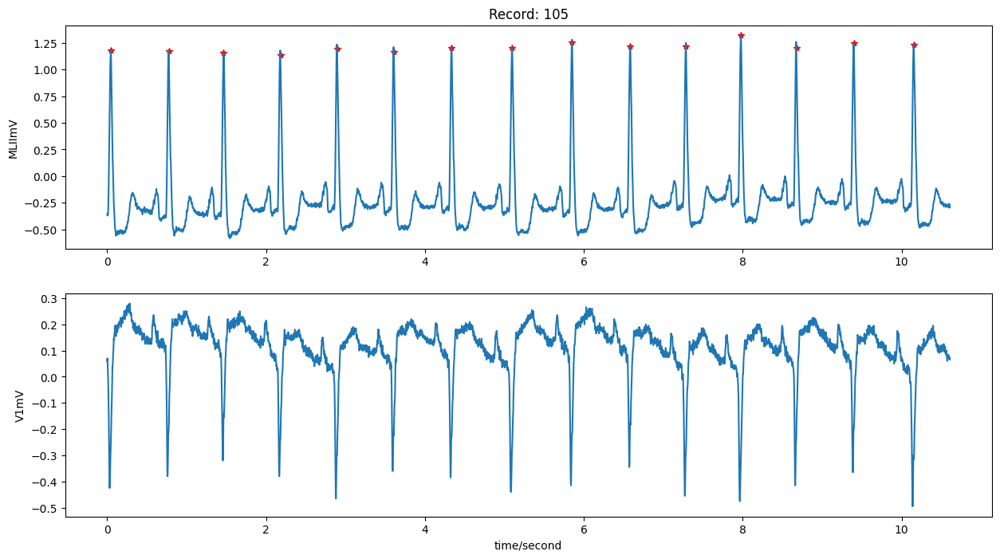

Signal values for record 103:
 [-0.32 -0.32 -0.31 ... -0.47 -0.47 -0.47]


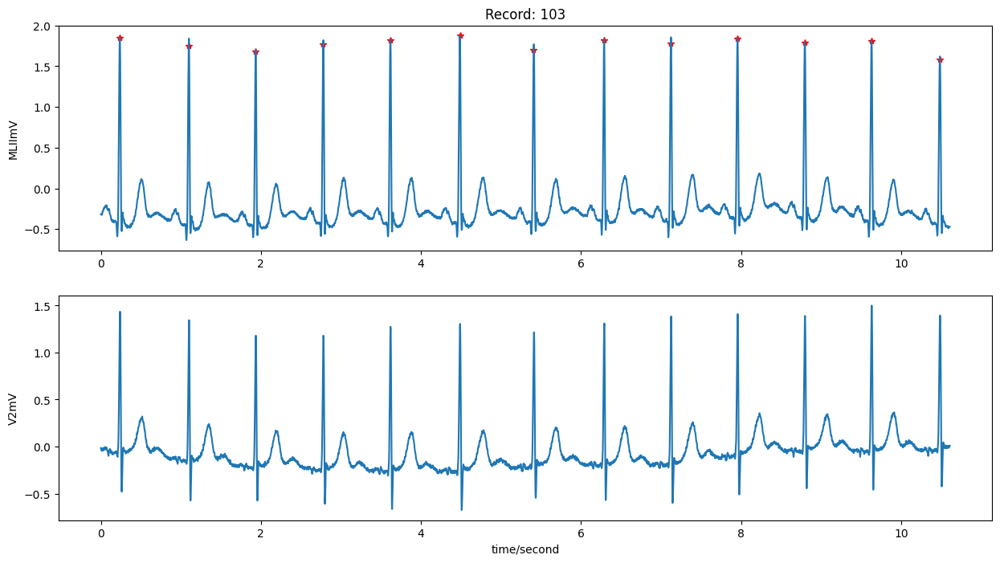

Signal values for record 104:
 [ 0.025  0.01   0.    ... -0.185 -0.175 -0.17 ]


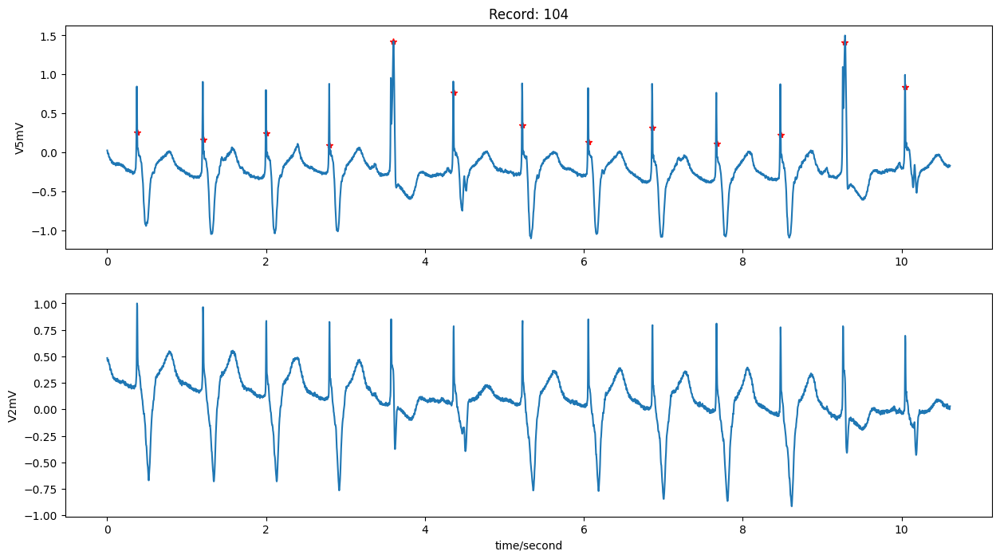

Signal values for record 122:
 [-0.725 -0.72  -0.72  ... -1.02  -1.03  -1.015]


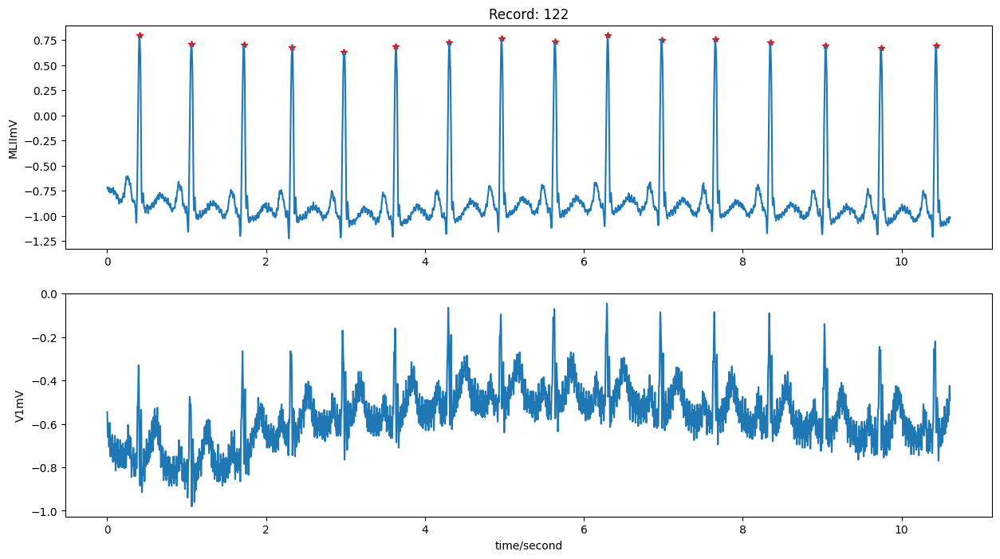

Signal values for record 100:
 [-0.365 -0.365 -0.36  ... -0.25  -0.25  -0.255]


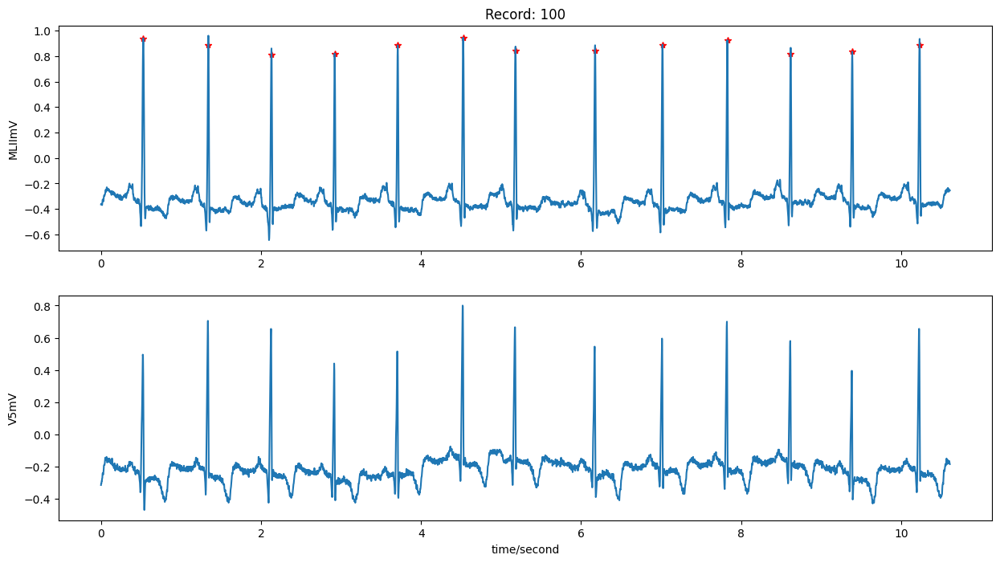

Signal values for record 202:
 [-0.035 -0.045 -0.065 ...  0.165  0.28   0.405]


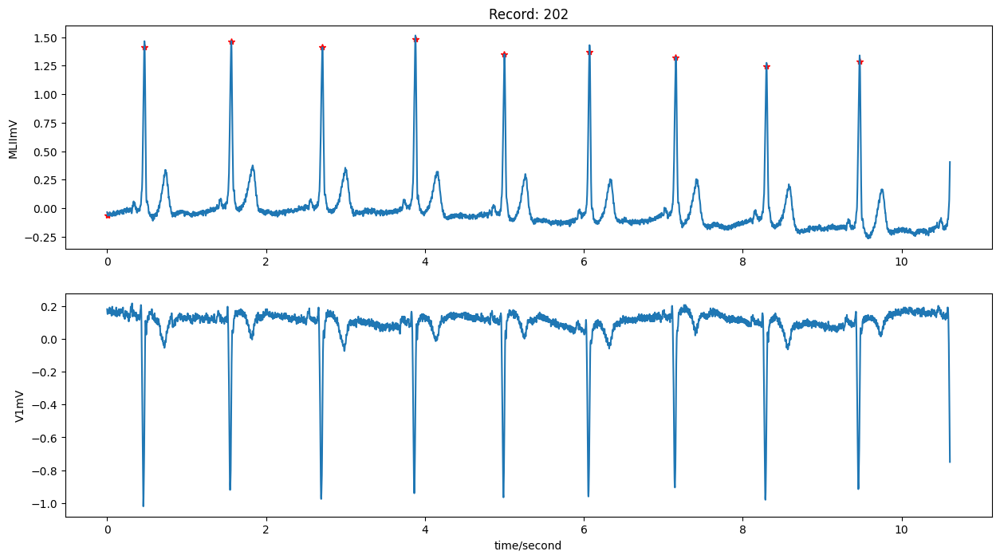

Signal values for record 207:
 [0.065 0.075 0.07  ... 0.115 0.105 0.09 ]


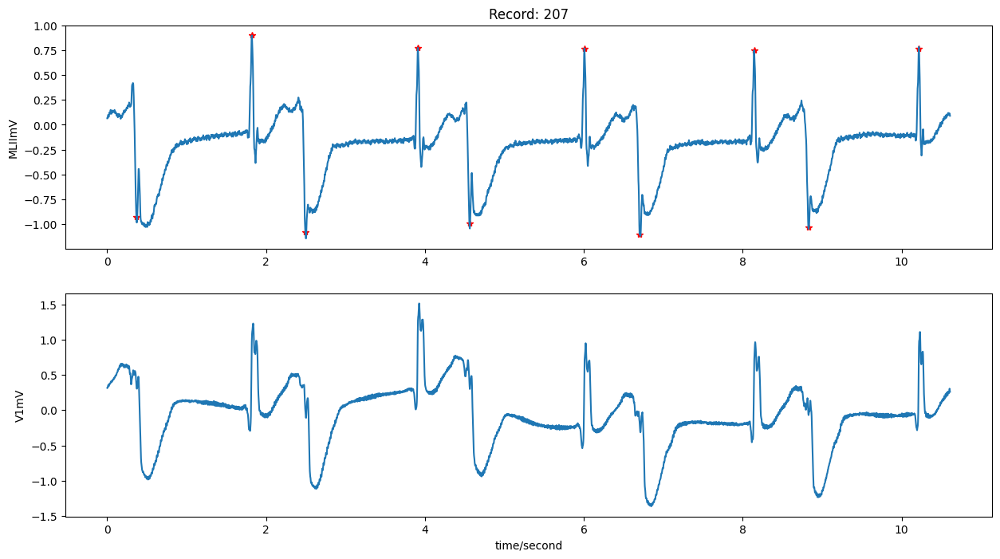

Signal values for record 214:
 [-0.165 -0.165 -0.17  ... -0.11  -0.155 -0.2  ]


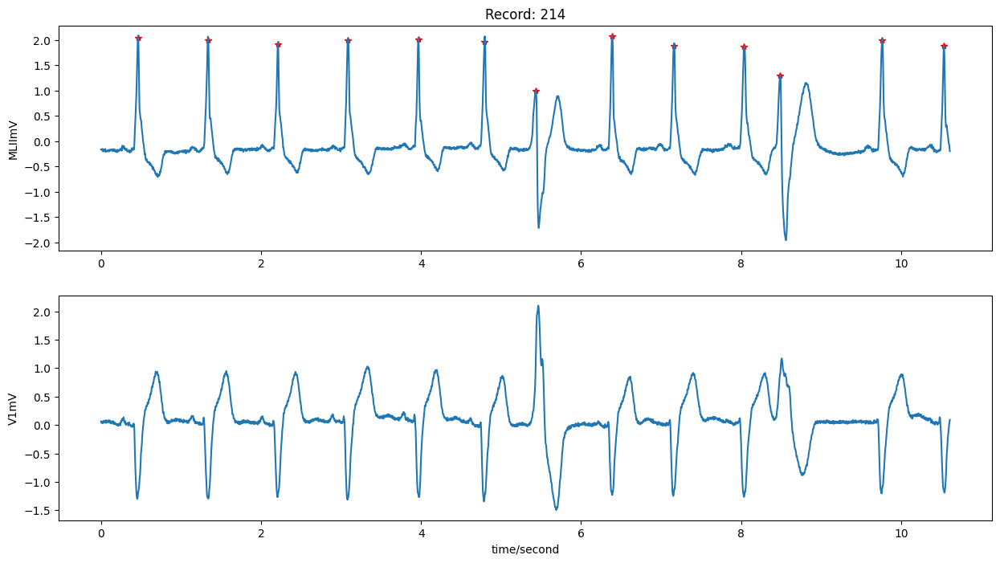

Signal values for record 217:
 [-0.155 -0.165 -0.175 ...  0.35   0.295  0.27 ]


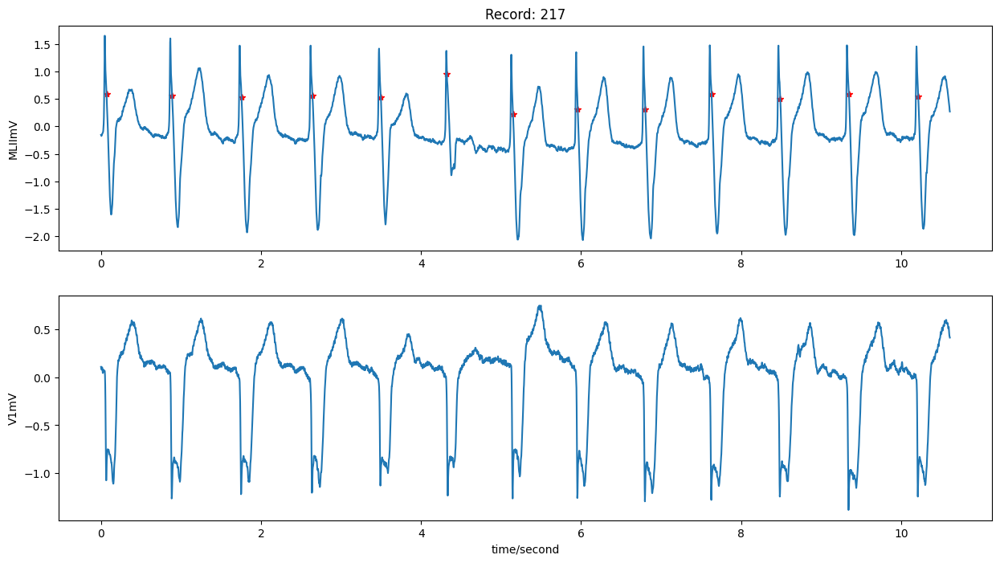

Signal values for record 232:
 [-0.205 -0.19  -0.185 ... -0.25  -0.26  -0.235]


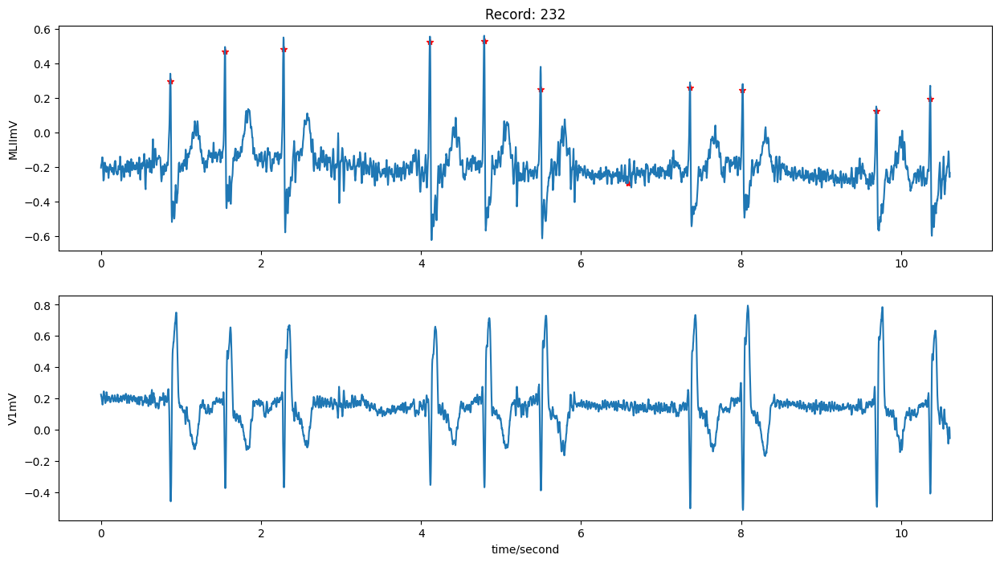

Signal values for record 116:
 [-1.295 -1.3   -1.305 ... -1.115 -1.085 -1.075]


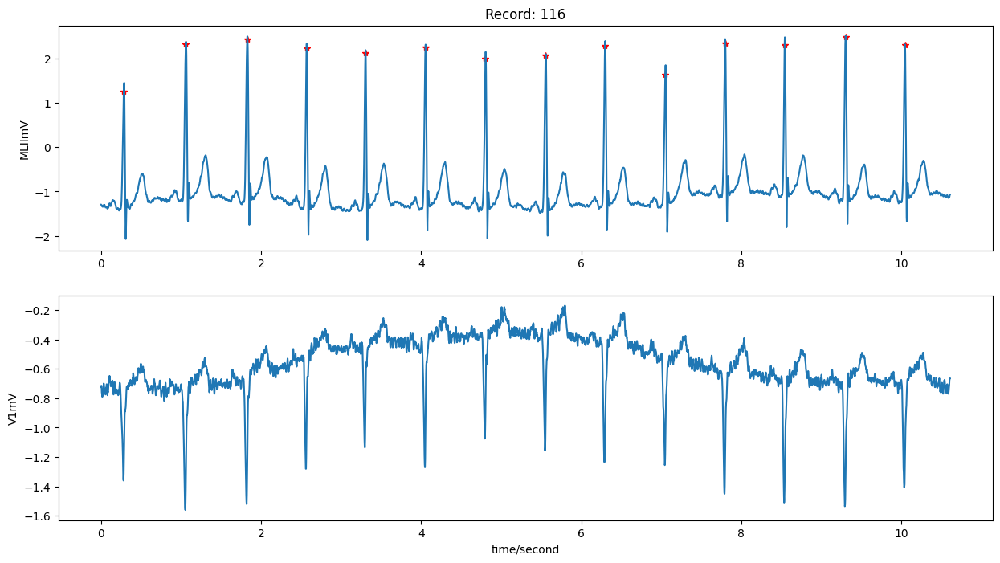

Signal values for record 230:
 [-0.2   -0.225 -0.24  ... -0.27  -0.265 -0.245]


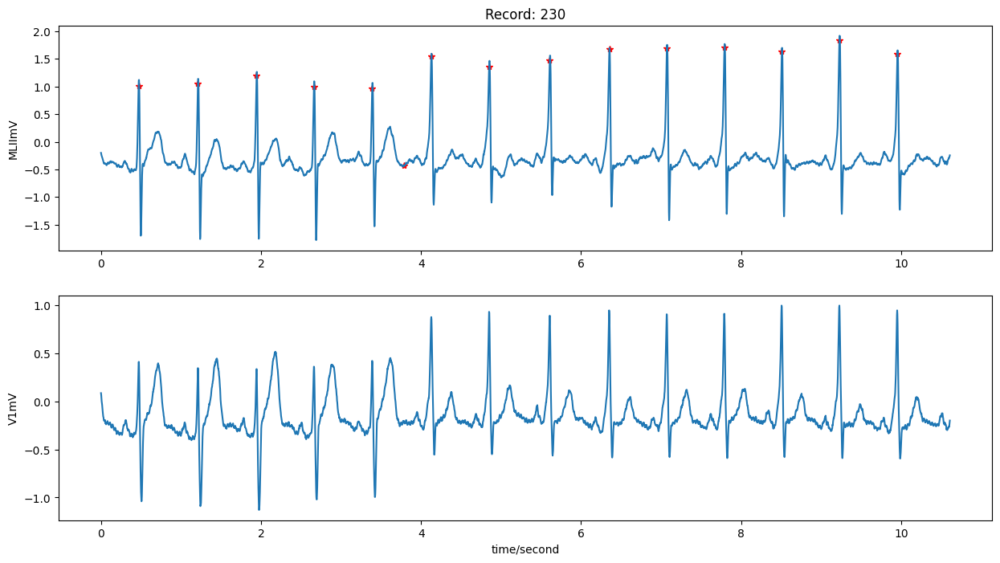

Signal values for record 118:
 [-1.07  -1.04  -0.99  ... -2.175 -2.16  -2.145]


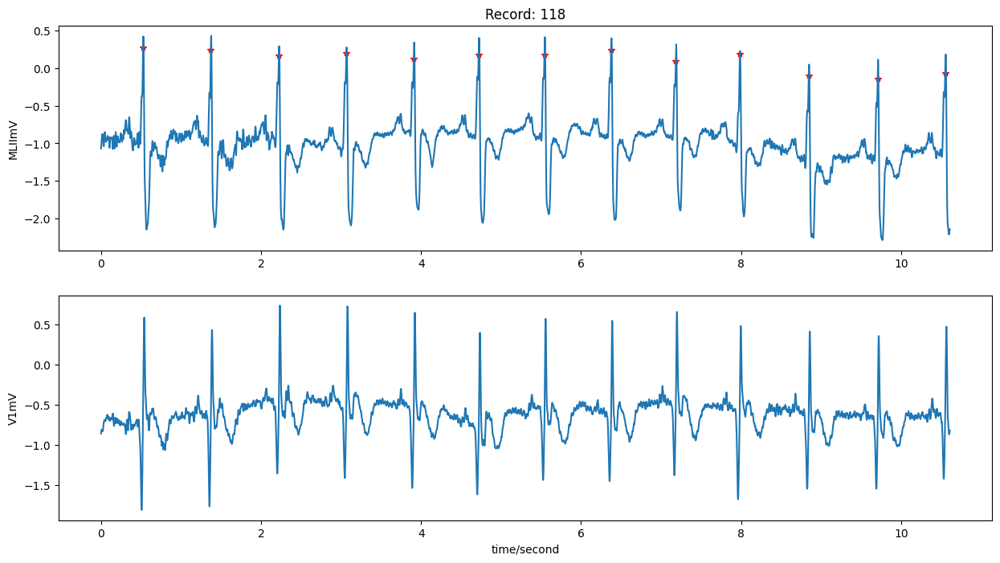

Signal values for record 221:
 [-0.225 -0.235 -0.225 ... -0.25  -0.24  -0.265]


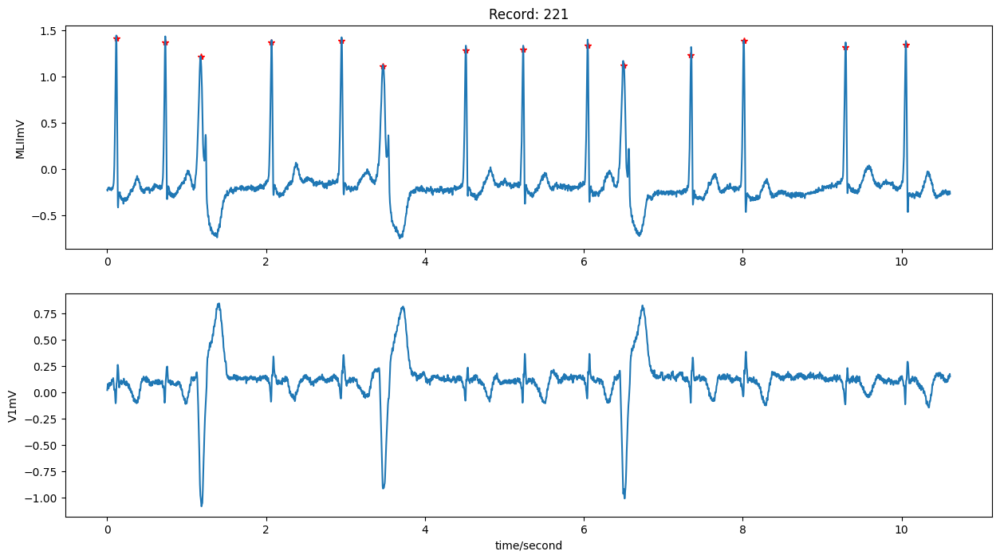

Signal values for record 210:
 [-0.11  -0.1   -0.11  ... -0.25  -0.24  -0.255]


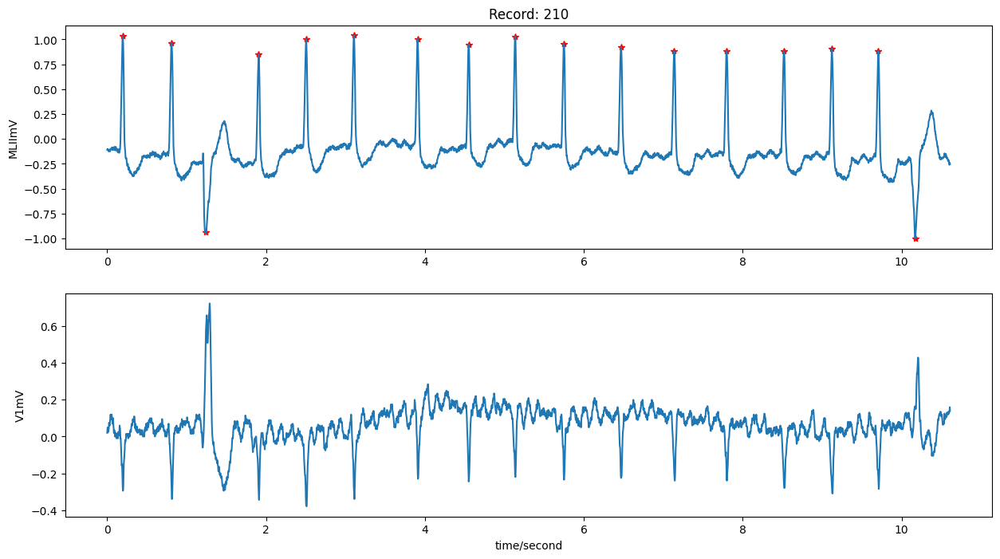

Signal values for record 234:
 [-0.13  -0.135 -0.135 ... -0.515 -0.5   -0.505]


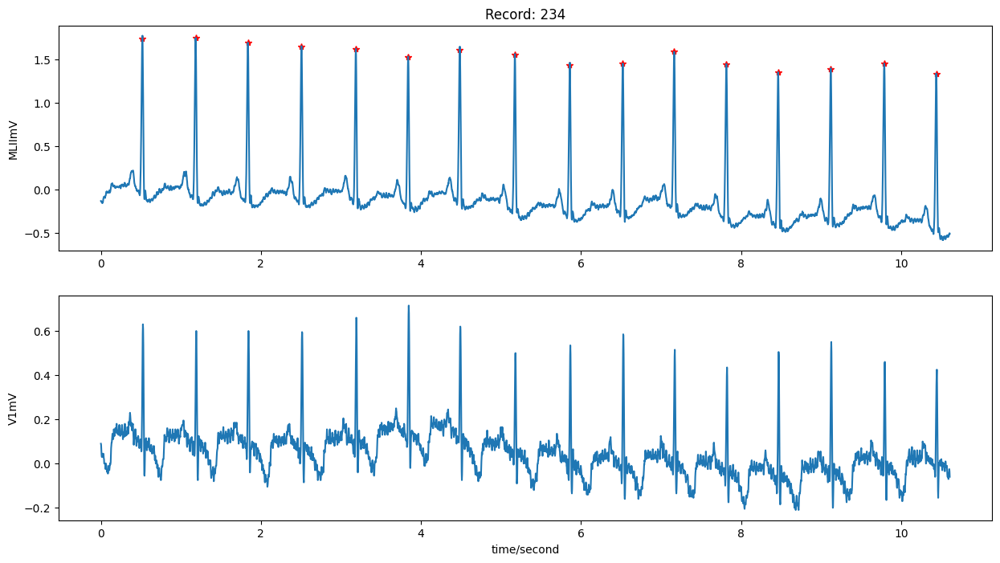

Signal values for record 111:
 [ 0.03   0.11   0.18  ... -0.16  -0.165 -0.17 ]


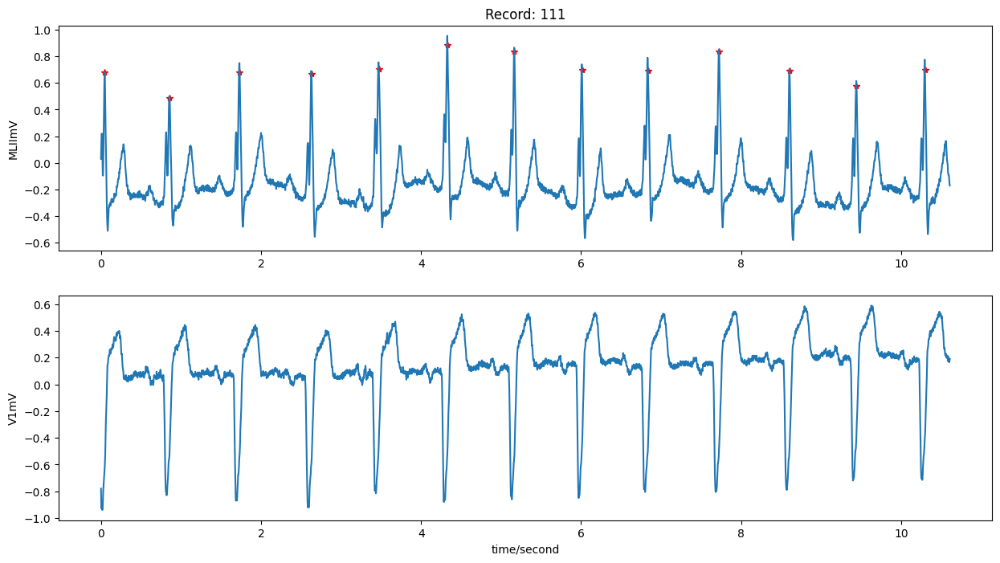

Signal values for record 117:
 [ 0.03   0.01  -0.11  ... -0.715 -0.725 -0.715]


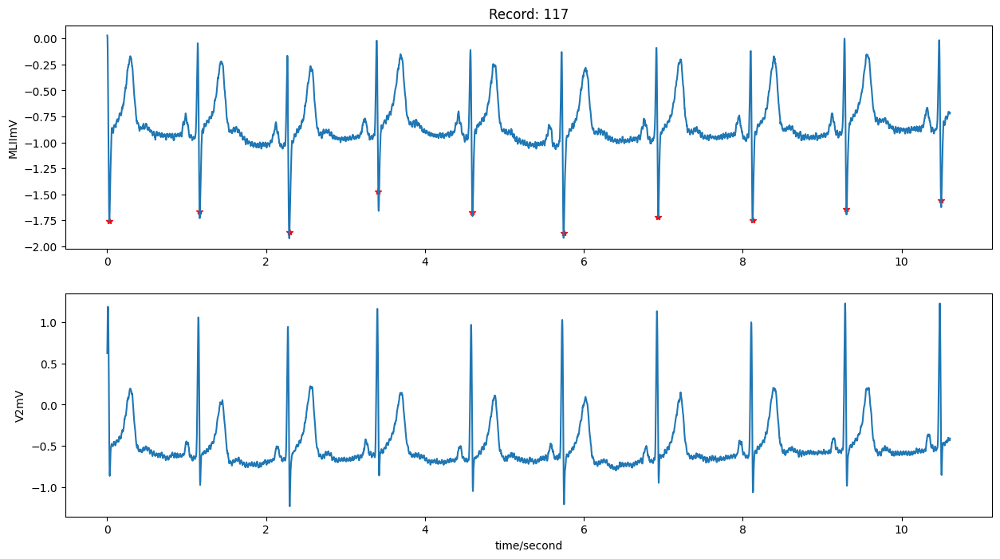

In [52]:
import os
import wfdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Directory containing the extracted MIT-BIH Arrhythmia Database files
extract_dir = "mit-bih-arrhythmia-database-1.0.0"

# Get all record files in the directory
record_files = [f for f in os.listdir(extract_dir) if f.endswith('.hea')]

# Loop through each record file and process it
for record_file in record_files:
    # Construct the filename without the extension
    record_name = os.path.splitext(record_file)[0]
    filename = os.path.join(extract_dir, record_name)

    # Read the record and annotation
    try:
        record = wfdb.rdrecord(filename, sampfrom=180, sampto=4000)
        annotation = wfdb.rdann(filename, 'atr', sampfrom=180, sampto=4000, shift_samps=True)

        # Create a DataFrame for the ECG data
        ecg = pd.DataFrame(np.array([list(range(len(record.p_signal))), record.p_signal[:, 0]]).T, columns=['TimeStamp', 'ECG'])

        # Convert the 'ECG' column to a NumPy array
        signal_values = ecg['ECG'].to_numpy()

        # Print the NumPy array for verification
        print(f"Signal values for record {record_name}:\n", signal_values)

        # Plot the record with the annotation
        wfdb.plot_wfdb(record=record, annotation=annotation, time_units='seconds', figsize=(15, 8))

    except Exception as e:
        print(f"Error processing record {record_name}: {e}")

# Note: Uncomment the next line to show plots in an interactive environment
# plt.show()


In [53]:
import os
import wfdb
import numpy as np

# Directory containing the extracted MIT-BIH Arrhythmia Database files
extract_dir = "mit-bih-arrhythmia-database-1.0.0"

# Get all record files in the directory
record_files = [f for f in os.listdir(extract_dir) if f.endswith('.hea')]

# Loop through each record file and process it
for record_file in record_files:
    # Construct the filename without the extension
    record_name = os.path.splitext(record_file)[0]
    filename = os.path.join(extract_dir, record_name)

    # Read the record and annotation
    try:
        record = wfdb.rdrecord(filename)

        # Process the record data (replace this with your processing logic)
        signal_values = record.p_signal[:, 0]

        # Save the array to a .dat file
        save_array_to_dat(signal_values, f"{record_name}_signal_values.dat", max_entries=10000)

        print(f"Saved signal values for record {record_name} to {record_name}_signal_values.dat")

    except Exception as e:
        print(f"Error processing record {record_name}: {e}")


Saved signal values for record 106 to 106_signal_values.dat
Saved signal values for record 101 to 101_signal_values.dat
Saved signal values for record 208 to 208_signal_values.dat
Saved signal values for record 102 to 102_signal_values.dat
Saved signal values for record 222 to 222_signal_values.dat
Saved signal values for record 124 to 124_signal_values.dat
Saved signal values for record 114 to 114_signal_values.dat
Saved signal values for record 223 to 223_signal_values.dat
Saved signal values for record 213 to 213_signal_values.dat
Saved signal values for record 119 to 119_signal_values.dat
Saved signal values for record 228 to 228_signal_values.dat
Saved signal values for record 112 to 112_signal_values.dat
Saved signal values for record 123 to 123_signal_values.dat
Saved signal values for record 107 to 107_signal_values.dat
Saved signal values for record 108 to 108_signal_values.dat
Saved signal values for record 201 to 201_signal_values.dat
Saved signal values for record 220 to 22

In [54]:
import os
import wfdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def read_ecg(file_name):
    """
    Function to read ECG data from a file.
    Assumes the file contains ECG data in CSV format.
    """
    return np.genfromtxt(file_name, delimiter=',')

# Directory containing the extracted MIT-BIH Arrhythmia Database files
extract_dir = "mit-bih-arrhythmia-database-1.0.0"

# Get all record files in the directory
record_files = [f for f in os.listdir(extract_dir) if f.endswith('.csv')]

# Loop through each record file and process it
for record_file in record_files:
    # Construct the full path for the record
    file_path = os.path.join(extract_dir, record_file)

    # Read the ECG data from the file
    try:
        ecg_data = read_ecg(file_path)

        # Plot the ECG data
        plt.figure(figsize=(10, 6))
        plt.plot(ecg_data)
        plt.title(f"ECG Data: {record_file}")
        plt.xlabel("Time")
        plt.ylabel("ECG Amplitude")
        plt.show()

    except Exception as e:
        print(f"Error processing file {record_file}: {e}")


In [103]:
import os
import numpy as np
from numpy import genfromtxt

# Function to read ECG data from a file
def read_ecg(file_name):
    return genfromtxt(file_name, delimiter=',')

# Function to test if a file contains an ECG signal
def QRS_test(file_name):
    '''
    QRS detection on file_name
    assuming 360 Hz sampling rate, may not work with very low sampling rate signal
    args:
        file_name: file containing ecg data in one column
    '''
    fs = 360
    # Constructing the file path using the correct directory structure
    file_path = os.path.join('/content/sample_data/data', file_name)
    if not os.path.isfile(file_path):
        raise AssertionError(f"{file_path} does not exist")

    ecg = read_ecg(file_path)
    R_peaks, S_point, Q_point = EKG_QRS_detect(ecg, fs, True, True)

    # Check if any R peaks are detected
    if len(R_peaks) > 0:
        print(f"{file_name}: ECG")
    else:
        print(f"{file_name}: Not an ECG")

# Directory containing the ECG files
data_dir = "/content/sample_data/data"

# Get all files in the directory
all_files = os.listdir(data_dir)

# Apply QRS_test to each file in the directory
for file_name in all_files:
    file_path = os.path.join(data_dir, file_name)
    if os.path.isfile(file_path):
        try:
            QRS_test(file_name)
        except Exception as e:
            print(f"Error processing {file_name}: {e}")


ECG_sample.dat: ECG
ecg.dat: ECG


In [109]:
import os

# Directory containing the ECG files
data_dir = "/content"

# Get all files in the directory
all_files = os.listdir(data_dir)

# Count the number of ECG files (files with ".dat" extension)
ecg_file_count = sum(1 for file_name in all_files if file_name.endswith('.dat'))

print(f"Total number of ECG files: {ecg_file_count}")


Total number of ECG files: 48


In [107]:
import os
import numpy as np
import random
from numpy import genfromtxt

# Function to read ECG data from a file
def read_ecg(file_name):
    return genfromtxt(file_name, delimiter=',')

# Function to test if a file contains an ECG signal
def QRS_test(file_name):

    fs = 360
    # Constructing the file path using the correct directory structure
    file_path = os.path.join('/content', file_name)
    if not os.path.isfile(file_path):
        raise AssertionError(f"{file_path} does not exist")

    ecg = read_ecg(file_path)
    R_peaks, S_point, Q_point = EKG_QRS_detect(ecg, fs, True, True)

    # Check if any R peaks are detected
    if len(R_peaks) > 0:
        print(f"{file_name}: ECG")
    else:
        print(f"{file_name}: Not an ECG")

# Directory containing the ECG files
data_dir = "/content"

# Get all files in the directory
all_files = os.listdir(data_dir)


119_signal_values.dat: ECG
217_signal_values.dat: ECG
215_signal_values.dat: ECG
213_signal_values.dat: ECG
201_signal_values.dat: ECG
115_signal_values.dat: ECG
116_signal_values.dat: ECG
214_signal_values.dat: ECG
109_signal_values.dat: ECG
100_signal_values.dat: ECG
234_signal_values.dat: ECG
209_signal_values.dat: ECG
105_signal_values.dat: ECG
104_signal_values.dat: ECG
221_signal_values.dat: ECG
122_signal_values.dat: ECG
ecg_detection_results.csv: ECG
203_signal_values.dat: ECG
231_signal_values.dat: ECG
124_signal_values.dat: ECG
111_signal_values.dat: ECG
118_signal_values.dat: ECG
232_signal_values.dat: ECG
219_signal_values.dat: ECG
117_signal_values.dat: ECG
107_signal_values.dat: ECG
207_signal_values.dat: ECG
102_signal_values.dat: ECG
223_signal_values.dat: ECG
121_signal_values.dat: ECG
123_signal_values.dat: ECG
233_signal_values.dat: ECG
202_signal_values.dat: ECG
106_signal_values.dat: ECG
230_signal_values.dat: ECG
208_signal_values.dat: ECG
205_signal_values.dat: E

In [112]:
output = """
119_signal_values.dat: ECG
217_signal_values.dat: ECG
215_signal_values.dat: ECG
213_signal_values.dat: ECG
201_signal_values.dat: ECG
115_signal_values.dat: ECG
116_signal_values.dat: ECG
214_signal_values.dat: ECG
109_signal_values.dat: ECG
100_signal_values.dat: ECG
234_signal_values.dat: ECG
209_signal_values.dat: ECG
105_signal_values.dat: ECG
104_signal_values.dat: ECG
122_signal_values.dat: ECG
203_signal_values.dat: ECG
231_signal_values.dat: ECG
124_signal_values.dat: ECG
111_signal_values.dat: ECG
118_signal_values.dat: ECG
232_signal_values.dat: ECG
219_signal_values.dat: ECG
117_signal_values.dat: ECG
107_signal_values.dat: ECG
207_signal_values.dat: ECG
102_signal_values.dat: ECG
223_signal_values.dat: ECG
121_signal_values.dat: ECG
123_signal_values.dat: ECG
233_signal_values.dat: ECG
202_signal_values.dat: ECG
106_signal_values.dat: ECG
230_signal_values.dat: ECG
205_signal_values.dat: ECG
200_signal_values.dat: ECG
113_signal_values.dat: ECG
228_signal_values.dat: ECG
114_signal_values.dat: ECG
220_signal_values.dat: ECG
212_signal_values.dat: ECG
103_signal_values.dat: ECG
101_signal_values.dat: ECG
222_signal_values.dat: ECG
210_signal_values.dat: ECG
112_signal_values.dat: ECG
108_signal_values.dat: ECG
221_signal_values.dat: Not an ECG
"""

# Split the output by lines and count the lines where "ECG" is mentioned
detected_ecg_count = sum(1 for line in output.split('\n') if 'ECG' in line)

print(f"Total number of ECG files: {detected_ecg_count}")


Total number of ECG files: 47


In [113]:
accuracy = detected_ecg_count/ecg_file_count * 100

print(f"Total number of files processed: {ecg_file_count}")
print(f"Correctly identified ECG files: {detected_ecg_count}")
print(f"Accuracy: {accuracy:.2f}%")

Total number of files processed: 48
Correctly identified ECG files: 47
Accuracy: 97.92%
